In [69]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt

In [70]:
data = pd.read_csv('/home/kyomukama/ACE/camonet/ml (NEW)/ML clinical outcomes data 14.02.25 version 2  - Sheet1.csv')

In [71]:
data.describe()

,age,organism_isolated,length_hosp_stay
count,598.000000,324.000000,596.000000
mean,30.272575,1.203704,22.578859
std,22.906648,0.432988,39.681067
min,0.000000,1.000000,0.000000
25%,12.000000,1.000000,6.000000
50%,28.000000,1.000000,14.000000
75%,44.000000,1.000000,27.000000
max,95.000000,3.000000,744.000000


In [72]:
data.head()

,sion,age,sex,Infection_Site_1,Infection_Site_2,Infection_Site_3,referral,ward,antib_prior_admi,Prio_antib_1,...,first_organism,sec_organism,third_organism,Resistance,antib_aft_culture,Antibioitic_aft_cul_1,Antibioitic_aft_cul_2,complications,treatment_outcome,length_hosp_stay
0,Arua,6.0,Male,Brain,NaN,NaN,Yes,Pediatric ward,Unknown,NaN,...,NaN,NaN,NaN,No,NaN,NaN,NaN,No,Cured/recovered,12.0
1,Arua,13.0,Male,Lungs,Systemic,NaN,Yes,Medical ward,Unknown,NaN,...,NaN,NaN,NaN,No,NaN,NaN,NaN,No,Cured/recovered,8.0
2,Arua,11.0,Male,Systemic,NaN,NaN,No,Pediatric ward,Unknown,NaN,...,NaN,NaN,NaN,No,NaN,NaN,NaN,Yes,Cured/recovered,14.0
3,Arua,18.0,Male,Surgical_site,NaN,NaN,Yes,Surgical ward,Unknown,NaN,...,Citrobacter spp,NaN,NaN,Yes,No,NaN,NaN,Yes,Cured/recovered,0.0
4,Arua,17.0,Female,Surgical_site,NaN,NaN,Yes,Maternity ward,Unknown,NaN,...,Escherichia coli,NaN,NaN,Yes,Yes,Chloramphenicol,NaN,Yes,Cured/recovered,10.0


In [73]:
data.rename(columns = {'sion': 'name_of_rrh'}, inplace = True)

In [74]:
data.columns

Index(['name_of_rrh', 'age', 'sex', 'Infection_Site_1', 'Infection_Site_2',
       'Infection_Site_3', 'referral', 'ward', 'antib_prior_admi',
       'Prio_antib_1', 'Prio_antib_2', 'Prio_antib_3', 'Prio_antib_4',
       'sympt_dura', 'hiv_status', 'intubated', 'cormobid_condition',
       'antibiotics', 'Prescribed_antib_1', 'Prescribed_antib_2',
       'Prescribed_antib_3', 'Prescribed_antib_4', 'Prescribed_antib_5',
       'organism_isolated', 'growth1', 'first_organism', 'sec_organism',
       'third_organism', 'Resistance', 'antib_aft_culture',
       'Antibioitic_aft_cul_1', 'Antibioitic_aft_cul_2', 'complications',
       'treatment_outcome', 'length_hosp_stay'],
      dtype='object')

# EDA

In [75]:
data.shape

(599, 35)

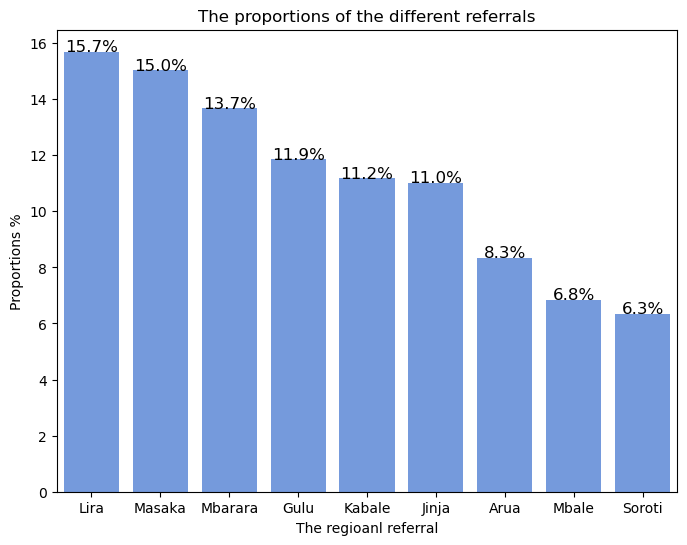

In [76]:
referral_count = data['name_of_rrh'].value_counts(normalize = True) * 100

plt.figure(figsize = (8,6))

ax = sns.barplot(x = referral_count.index, y = referral_count.values, color = 'cornflowerblue')

plt.title("The proportions of the different referrals")
plt.xlabel('The regioanl referral')
plt.ylabel("Proportions %")

# Show percentage values on bars
for i, val in enumerate(referral_count.values):
    plt.text(i, val, f"{val:.1f}%", ha='center', fontsize=12)
    

plt.show()

In [77]:
data['age'].describe()

count    598.000000
mean      30.272575
std       22.906648
min        0.000000
25%       12.000000
50%       28.000000
75%       44.000000
max       95.000000
Name: age, dtype: float64

In [78]:
data[data['age'].isna()].index

Index([567], dtype='int64')

In [79]:
data['age'] = data['age'].fillna(data['age'].median())

Text(0.5, 1.0, 'Age distribution')

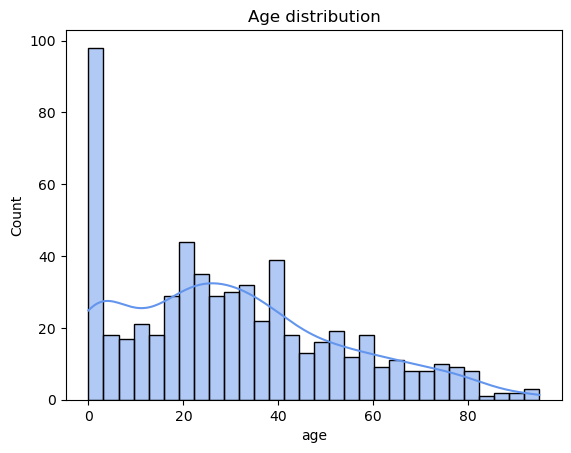

In [80]:
sns.histplot(data, x= 'age', bins = 30, kde = True, color = 'cornflowerblue')

plt.title("Age distribution")

In [81]:
data['sex'].info

<bound method Series.info of 0        Male
1        Male
2        Male
3        Male
4      Female
        ...  
594    Female
595    Female
596    Female
597    Female
598    Female
Name: sex, Length: 599, dtype: object>

/tmp/ipykernel_4703/332617357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax =sns.barplot(x = sex_count.index, y = sex_count.values, palette = 'Set1')


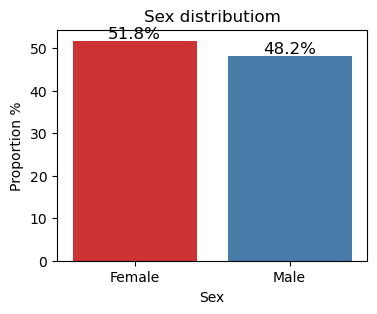

In [82]:
sex_count = data['sex'].value_counts(normalize = True)* 100

plt.figure(figsize = (4,3))

ax =sns.barplot(x = sex_count.index, y = sex_count.values, palette = 'Set1')

plt.title('Sex distributiom')
plt.xlabel('Sex')
plt.ylabel('Proportion %')

# Show percentage values on bars
for i, val in enumerate(sex_count.values):
    plt.text(i, val + 0.5, f"{val:.1f}%", ha='center', fontsize=12)

plt.show()

<Axes: xlabel='name_of_rrh', ylabel='age'>

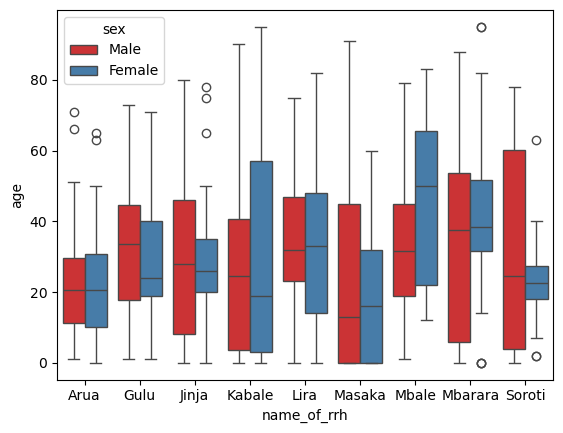

In [83]:
sns.boxplot(data, x= 'name_of_rrh', y = 'age', hue = 'sex', palette= 'Set1')

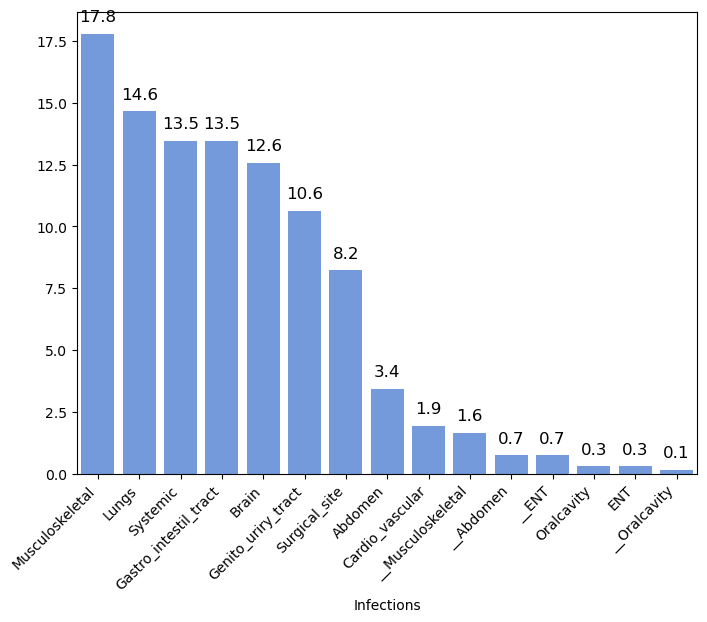

In [84]:
infection = pd.melt(
    data,
    id_vars = 'ward',
    value_vars= ['Infection_Site_1', 'Infection_Site_2', 'Infection_Site_3'],
    value_name= 'Infections'
)

infection.dropna(subset = 'Infections')

plt.figure(figsize = (8,6))

infection_count = infection['Infections'].value_counts(normalize = True)* 100

sns.barplot(x = infection_count.index , y = infection_count.values , color = 'cornflowerblue')

plt.xticks(rotation = 45, ha = 'right')

# Show percentage values on bars
for i, val in enumerate(infection_count.values):
    plt.text(i, val + 0.5, f"{val:.1f}", ha='center', fontsize=12)

plt.show()

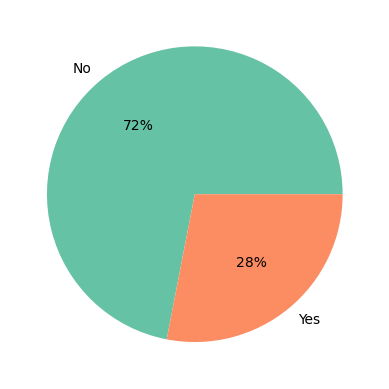

In [85]:
# define Seaborn color palette to use 
palette_color = sns.color_palette('Set2') 
referral_count =  data['referral'].value_counts(normalize = True)*100
  
# plotting data on chart 
plt.pie(referral_count.values, labels= referral_count.index, colors=palette_color, autopct='%.0f%%') 
  
# displaying chart 
plt.show() 

<function matplotlib.pyplot.show(close=None, block=None)>

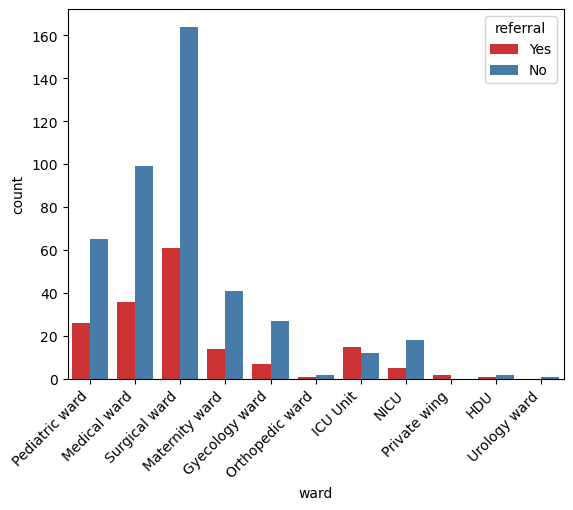

In [86]:
sns.countplot(data, x = 'ward', hue = 'referral', palette = 'Set1')

plt.xticks(rotation = 45, ha ='right')

plt.show

<Axes: xlabel='referral', ylabel='length_hosp_stay'>

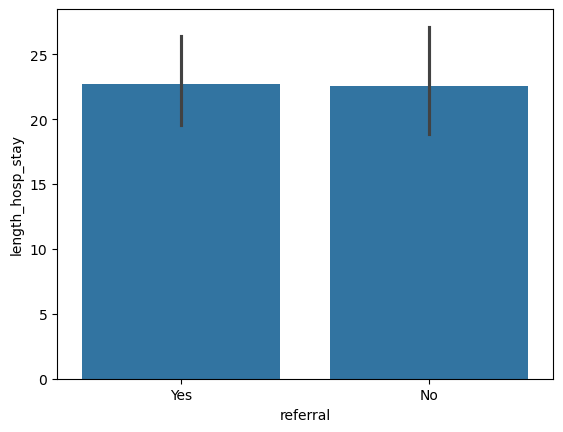

In [87]:
sns.barplot(data, x= 'referral', y = 'length_hosp_stay')

<Axes: xlabel='hiv_status', ylabel='length_hosp_stay'>

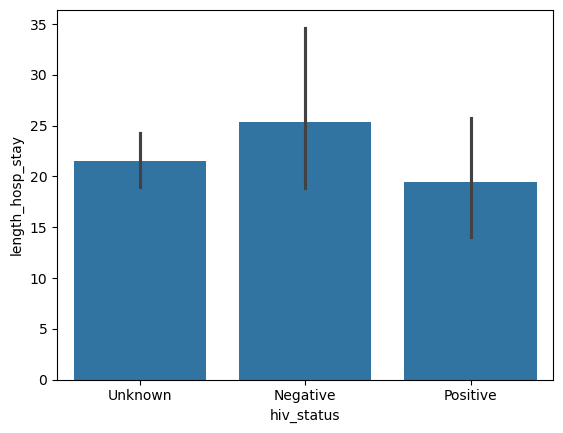

In [88]:
sns.barplot(data, x= 'hiv_status', y = 'length_hosp_stay')

In [89]:
data['intubated'] = data['intubated'].replace({'Unknown': 'No'})

<Axes: xlabel='intubated', ylabel='length_hosp_stay'>

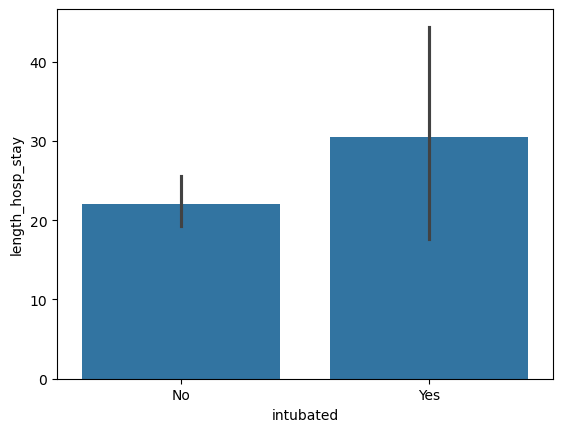

In [90]:
sns.barplot(data, x= 'intubated', y = 'length_hosp_stay')

In [91]:
# def check_prior_antibiotics(row):
#     for col in ['Prio_antib_1', 'Prio_antib_2', 'Prio_antib_3', 'Prio_antib_4']:
#         if pd.notna(row[col]):  # Check if the value is not NaN/None
#             return 'Yes'
#     return 'No'


# # Create the new 'Prio_antib' column
# data['Prio_antib'] = data.apply(check_prior_antibiotics, axis=1)

In [92]:
# drop the other columns of rior antibiotic use

data.drop(columns = ['Prio_antib_1', 'Prio_antib_2', 'Prio_antib_3', 'Prio_antib_4'], inplace = True, axis = 1)

In [93]:
# def resitance_check (row) :
#     if any(row[['Resistance1 ', 'Resistance2', 'Resistance3']] =='Yes'):
#         return 'Yes'
#     else:
#         return 'No'
    
# # Create a new column 'resistance' using the function
# data['resistance'] = data.apply(resitance_check, axis=1)

<Axes: xlabel='Resistance', ylabel='length_hosp_stay'>

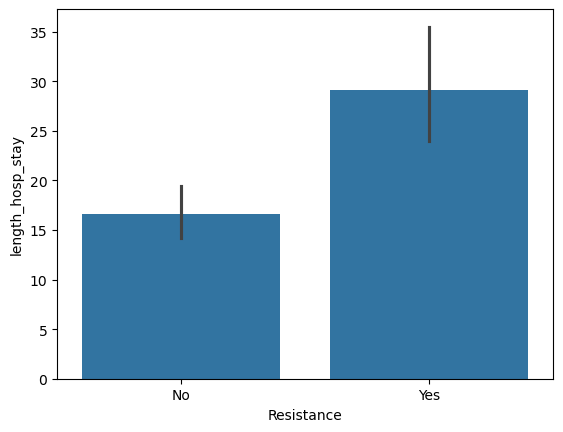

In [94]:
sns.barplot(data, x= 'Resistance', y = 'length_hosp_stay')

In [95]:
#data.drop(columns =['growth1'], inplace= True)

In [96]:
# HDU, ICU , NICU ----- ICU
# Orthopedic, private, urology - medical ward

data['ward'].replace({'HDU':'ICU Unit', 'NICU':'ICU Unit', 'Private wing':'Medical ward', 'Gyecology ward':'Medical ward','Urology ward':'Medical ward', 'Orthopedic ward':'Medical ward'}, inplace=True)

/tmp/ipykernel_4703/3353176426.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['ward'].replace({'HDU':'ICU Unit', 'NICU':'ICU Unit', 'Private wing':'Medical ward', 'Gyecology ward':'Medical ward','Urology ward':'Medical ward', 'Orthopedic ward':'Medical ward'}, inplace=True)


In [97]:
data.drop(columns= ['antib_aft_culture', 'antibiotics'], inplace = True)

# Filling missingness

## Infections sites

In [98]:
def infection_missing(df) :
    for col in ['Infection_Site_1', 'Infection_Site_2', 'Infection_Site_3']:
        if pd.isna(df[col]):
            df[col] = 'No infection'
    return df

data = data.apply(infection_missing, axis = 1)

## Prio antibiotics taken

In [99]:
# def prio_antib_missing(df) :
#     for col in ['Prio_antib_1', 'Prio_antib_2', 'Prio_antib_3', 'Prio_antib_4']:
#         if pd.isna(df[col]):
#             df[col] = 'UNK'
#     return df

# data = data.apply(prio_antib_missing, axis = 1)

## Cormobidity

In [100]:
# def cormobidity_missing(df) :
#     for col in ['Comobidity1', 'Comobidity2', 'Comobidity3']:
#         if pd.isna(df[col]):
#             df[col] = 'UNK'
#     return df

# data = data.apply(cormobidity_missing, axis = 1)

## Antibiotic prescribed

In [101]:
def Prescribed_antib_missing(df) :
    for col in ['Prescribed_antib_1', 'Prescribed_antib_2', 'Prescribed_antib_3', 'Prescribed_antib_4', 'Prescribed_antib_5']:
        if pd.isna(df[col]):
            df[col] = 'No antibiotic prescribed'
    return df

data = data.apply(Prescribed_antib_missing, axis = 1)

## Pathogens

In [102]:
def pathogen_missing(df) :
    for col in ['first_organism', 'sec_organism', 'third_organism']:
        if pd.isna(df[col]):
            df[col] = 'No pathogen'
    return df

data = data.apply(pathogen_missing, axis = 1)

## Antibiotics after culture

In [103]:
def antib_aft_missing(df) :
    for col in ['Antibioitic_aft_cul_1', 'Antibioitic_aft_cul_2']:
        if pd.isna(df[col]):
            df[col] = 'No antibiotic precibed'
    return df

data = data.apply(antib_aft_missing, axis = 1)

## antibiotics

In [104]:
# def Antibiotics(df) :
#     for col in ['antibiotics']:
#         if pd.isna(df[col]):
#             df[col] = 'No'
#     return df

# data = data.apply(Antibiotics, axis = 1)

## antibiotics after culture (Yes/No)

In [105]:
# def Antibiotics_aft(df) :
#     for col in ['antib_aft_culture']:
#         if pd.isna(df[col]):
#             df[col] = 'No'
#     return df

# data = data.apply(Antibiotics_aft, axis = 1)

## Complications

In [106]:
def Complications(df) :
    for col in ['complications']:
        if pd.isna(df[col]):
            df[col] = 'No'
    return df

data = data.apply(Complications, axis = 1)

## length of hospital stay

In [107]:
data.dropna(subset = 'length_hosp_stay', inplace = True)

# Encoding data

## Label Encoding

In [108]:
from sklearn.preprocessing import LabelEncoder

Le = LabelEncoder()

In [109]:
columns_to_encode = data.drop(columns = ['age', 'length_hosp_stay', 'referral', 'sex', 'intubated', 'Resistance',  'complications'])

for column in columns_to_encode:
    data[column] = Le.fit_transform(data[column])

## One hot encoding

In [110]:
#sex
data['sex'] = data['sex'].replace({'Male': 0, 'Female': 1})

/tmp/ipykernel_4703/1529081699.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['sex'] = data['sex'].replace({'Male': 0, 'Female': 1})


In [111]:
data = data.replace ({'Yes': 1, "No": 0})

/tmp/ipykernel_4703/2147984969.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data = data.replace ({'Yes': 1, "No": 0})


In [112]:
data.tail()

,name_of_rrh,age,sex,Infection_Site_1,Infection_Site_2,Infection_Site_3,referral,ward,antib_prior_admi,sympt_dura,...,growth1,first_organism,sec_organism,third_organism,Resistance,Antibioitic_aft_cul_1,Antibioitic_aft_cul_2,complications,treatment_outcome,length_hosp_stay
594,8,2.0,1,7,4,2,0,3,1,2,...,0,13,10,3,0,15,10,0,0,10.0
595,8,27.0,1,10,4,2,0,1,2,2,...,1,21,10,3,1,15,10,0,0,3.0
596,8,20.0,1,10,4,2,0,1,1,2,...,0,13,10,3,0,15,10,0,0,6.0
597,8,24.0,1,10,4,2,1,1,1,4,...,0,13,10,3,0,15,10,0,1,8.0
598,8,2.0,1,6,4,2,0,3,1,2,...,1,21,10,3,1,7,6,0,0,21.0


# Correlation 

Correaltion with the target variable and also how the different variable correlate with each other

/tmp/ipykernel_4703/848355969.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_corr.values, y=top_corr.index, palette='RdBu')


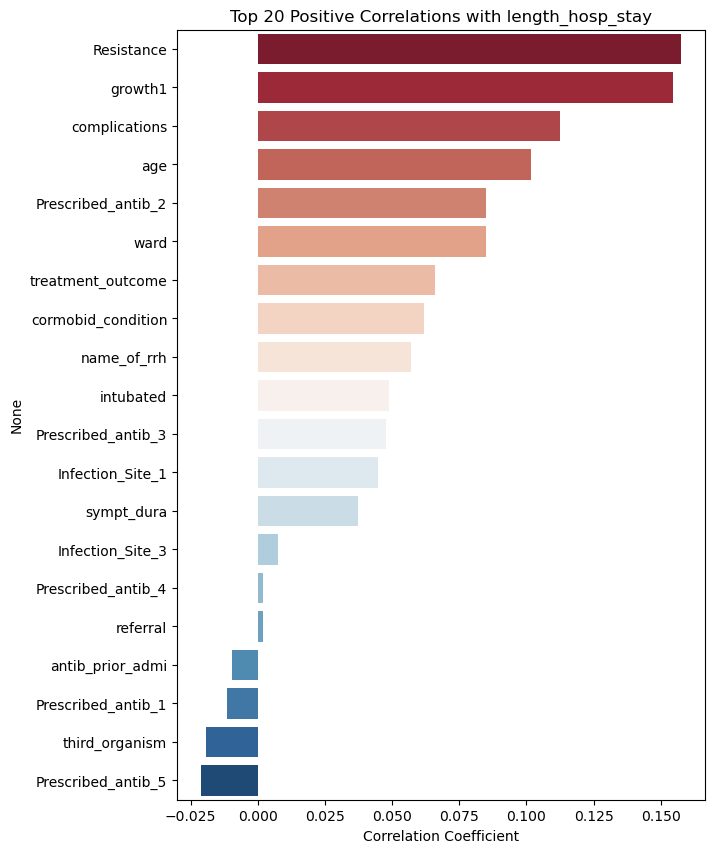

In [113]:
def plot_correlations(df, target_column, n_top = 39):
    
    # Calculate correlations with target variable
    correlations = df.corr()[target_column].sort_values(ascending=False)
    
    # Get top N most correlated features (excluding the target itself)
    top_corr = correlations[1:n_top+1]
    
    # Create figure with two subplots
    plt.figure(figsize=(15, 10))
    
    # Plot 1: Horizontal bar chart of top correlations
    plt.subplot(1, 2, 1)
    sns.barplot(x=top_corr.values, y=top_corr.index, palette='RdBu')
    plt.title(f'Top {n_top} Positive Correlations with {target_column}')
    plt.xlabel('Correlation Coefficient')

plot_correlations(data, 'length_hosp_stay', n_top=20)

<Figure size 1500x1000 with 0 Axes>

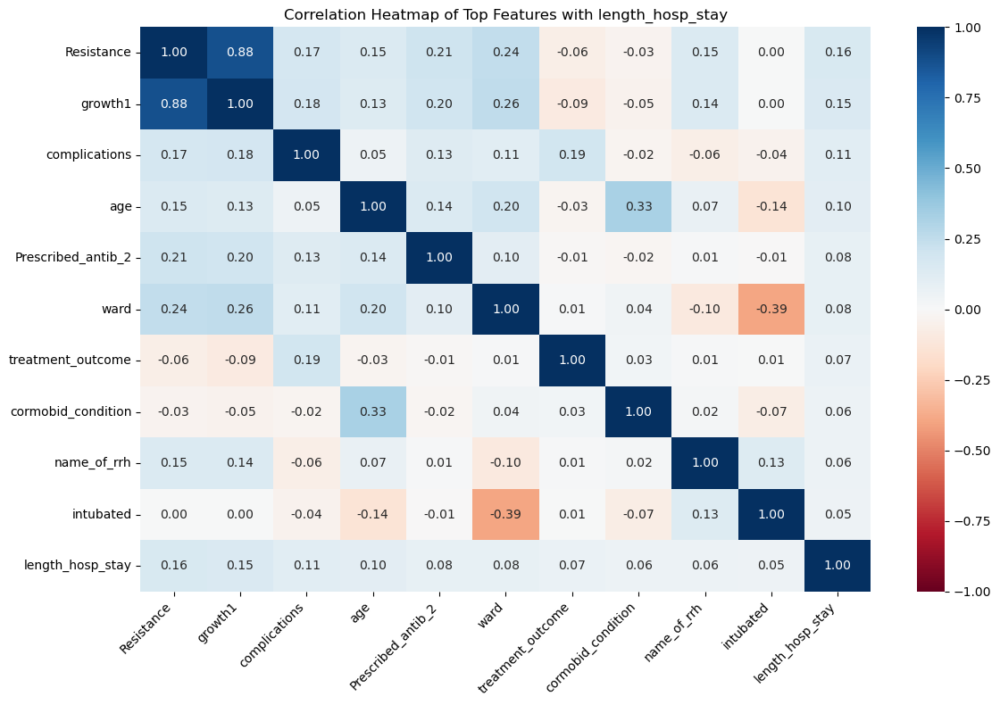

In [114]:
def plot_correlations(df, target_column, n_top=20):
    
    # Calculate correlations with target variable
    correlations = df.corr()[target_column].sort_values(ascending=False)
    
    # Get top N most correlated features (excluding the target itself)
    top_corr = correlations[1:n_top+1]
    #bottom_corr = correlations[-(n_top):]
    
    # Create figure with two subplots
    plt.figure(figsize=(15, 10))
    
    # Create heatmap of top correlated features
    plt.figure(figsize=(12, 8))
    top_features = list(top_corr.index[:10]) + [target_column]  # Top 10 + target
    correlation_matrix = df[top_features].corr()
    
    sns.heatmap(correlation_matrix, 
                annot=True,
                cmap='RdBu',
                vmin=-1, 
                vmax=1,
                center=0,
                fmt='.2f')
    plt.title(f'Correlation Heatmap of Top Features with {target_column}')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

plot_correlations(data, 'length_hosp_stay', n_top=20)

# ML

## Data

In [115]:
print(data.shape)

data.head()

(596, 29)


,name_of_rrh,age,sex,Infection_Site_1,Infection_Site_2,Infection_Site_3,referral,ward,antib_prior_admi,sympt_dura,...,growth1,first_organism,sec_organism,third_organism,Resistance,Antibioitic_aft_cul_1,Antibioitic_aft_cul_2,complications,treatment_outcome,length_hosp_stay
0,0,6.0,0,1,4,2,1,3,1,2,...,0,13,10,3,0,15,10,0,1,12.0
1,0,13.0,0,6,6,2,1,2,1,0,...,0,13,10,3,0,15,10,0,1,8.0
2,0,11.0,0,11,4,2,0,3,1,2,...,0,13,10,3,0,15,10,1,1,14.0
3,0,18.0,0,10,4,2,1,4,1,2,...,1,4,10,3,1,15,10,1,1,0.0
4,0,17.0,1,10,4,2,1,1,1,2,...,1,9,10,3,1,6,10,1,1,10.0


In [116]:
data.drop(columns = ['growth1'], inplace = True)

In [117]:
data.drop(columns = [
    'intubated',  
    'Infection_Site_3', 
    'Antibioitic_aft_cul_2',
    'Infection_Site_3',
    'third_organism',
    'Prescribed_antib_4',
    'Prescribed_antib_5'
], inplace = True)

In [118]:
data.drop(columns = ['treatment_outcome'], inplace = True)

In [119]:
data.to_csv('Data all.csv', index = False)

In [120]:
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay']) 

Shapiro-Wilk Test: Statistic=0.9935793320860281, p-value=0.01223393508687798
Log-transformed sample does not look Gaussian (reject H0)


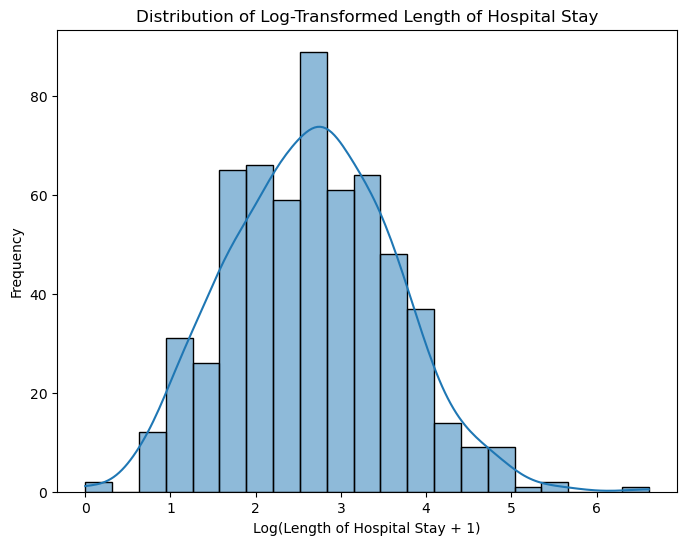

In [121]:
from scipy import stats

# Assuming you have a DataFrame named 'data' with a 'length_hosp_stay' column

# Log transform the 'length_hosp_stay' column
log_length_hosp_stay = np.log1p(data['length_hosp_stay'])

# Visualize the log-transformed data
plt.figure(figsize=(8, 6))
sns.histplot(log_length_hosp_stay, kde=True)
plt.title('Distribution of Log-Transformed Length of Hospital Stay')
plt.xlabel('Log(Length of Hospital Stay + 1)')
plt.ylabel('Frequency')

# Save the plot
plt.savefig("log_length_hosp_stay_distribution.png")

# Perform a normality test (e.g., Shapiro-Wilk)
shapiro_test = stats.shapiro(log_length_hosp_stay)
print(f"Shapiro-Wilk Test: Statistic={shapiro_test.statistic}, p-value={shapiro_test.pvalue}")

# Interpretation (example)
alpha = 0.05  # Significance level
if shapiro_test.pvalue > alpha:
    print("Log-transformed sample looks Gaussian (fail to reject H0)")
else:
    print("Log-transformed sample does not look Gaussian (reject H0)")

# Show the plot
plt.show()


## Modelling

# Huber model

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run mercurial-cow-64 at: http://127.0.0.1:8080/#/experiments/320510952361426209/runs/a3b1453820c342c0bb3add296ce77f79
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/320510952361426209
Mean Absolute Error: 14.99
Root Mean Squared Error: 24.22
R-squared Score: -0.0635


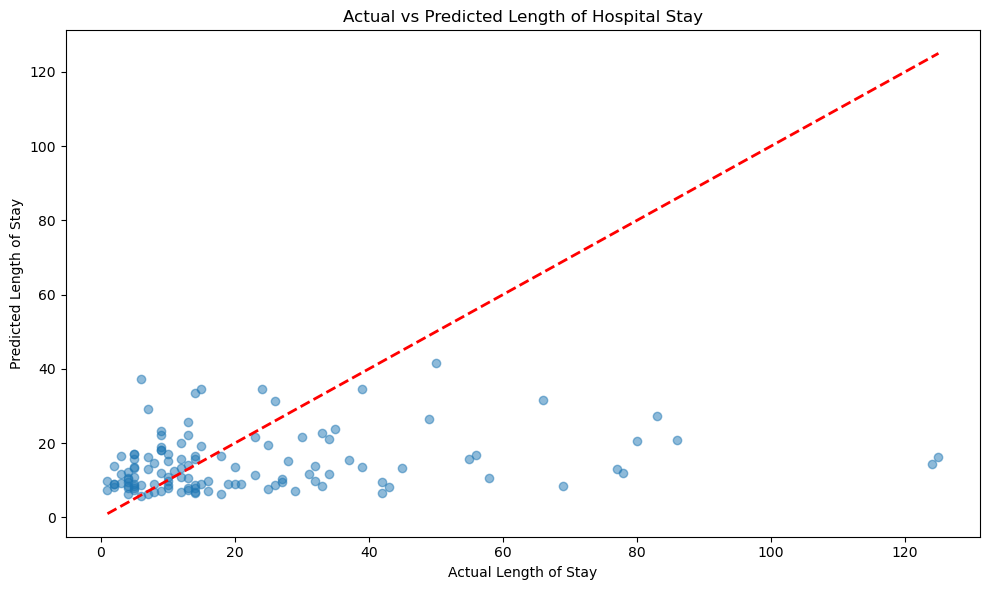

In [122]:
import mlflow
from mlflow.models import infer_signature
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import HuberRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

X = data[[
    'Resistance','referral','antib_prior_admi',
    'hiv_status', 'organism_isolated',
    'ward', 'cormobid_condition', 'sympt_dura',
    'Antibioitic_aft_cul_1', 'Infection_Site_2',
    'sec_organism', 'Infection_Site_1', 'first_organism',
    'Prescribed_antib_1', 'name_of_rrh', 'Prescribed_antib_3'
]]
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters
params = {
    'epsilon': 2,
    'max_iter': 500,
    'alpha': 0.001
}

# Train the model
huber = HuberRegressor(**params)
huber.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = huber.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(huber, "huber_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()], 
         [y_test_original.min(), y_test_original.max()], 
         'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay')
plt.tight_layout()
plt.show()

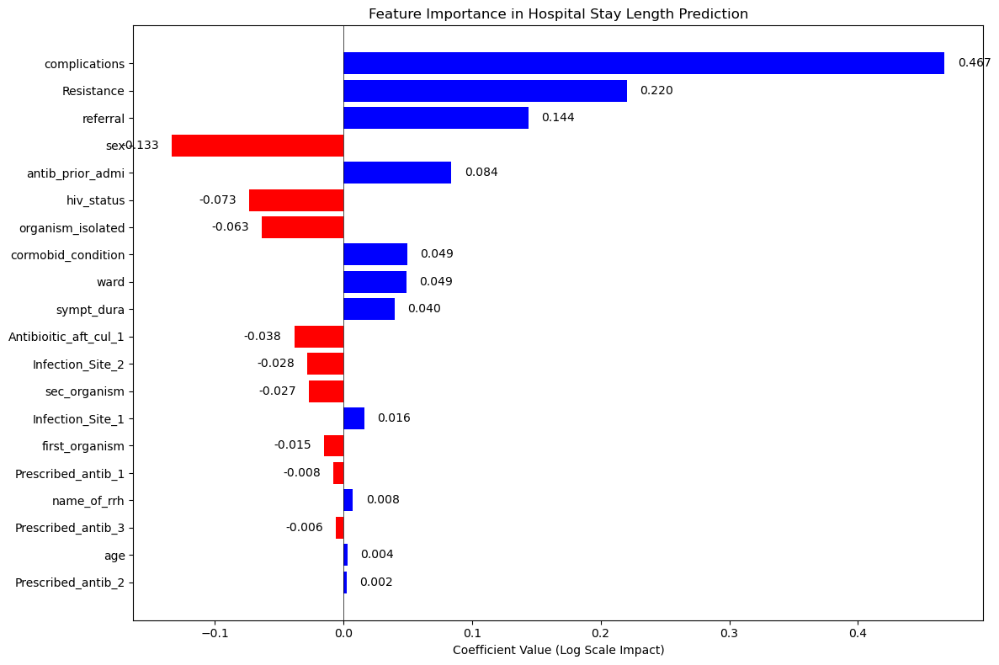


Feature Importance Rankings:
              feature  coefficient  abs_coefficient
        complications     0.467390         0.467390
           Resistance     0.220183         0.220183
             referral     0.143927         0.143927
                  sex    -0.133139         0.133139
     antib_prior_admi     0.084055         0.084055
           hiv_status    -0.072981         0.072981
    organism_isolated    -0.063192         0.063192
   cormobid_condition     0.049478         0.049478
                 ward     0.049202         0.049202
           sympt_dura     0.039803         0.039803
Antibioitic_aft_cul_1    -0.038152         0.038152
     Infection_Site_2    -0.027908         0.027908
         sec_organism    -0.026564         0.026564
     Infection_Site_1     0.016244         0.016244
       first_organism    -0.014798         0.014798
   Prescribed_antib_1    -0.007820         0.007820
          name_of_rrh     0.007538         0.007538
   Prescribed_antib_3    -0.005871

In [123]:
# Get feature names and coefficients
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'coefficient': huber.coef_
})

# Sort by absolute value of coefficient while keeping the sign
feature_importance['abs_coef'] = abs(feature_importance['coefficient'])
feature_importance = feature_importance.sort_values('abs_coef', ascending=True)

# Create a horizontal bar plot
plt.figure(figsize=(12, 8))
colors = ['red' if c < 0 else 'blue' for c in feature_importance['coefficient']]
bars = plt.barh(feature_importance['feature'], feature_importance['coefficient'], color=colors)

# Add vertical line at x=0
plt.axvline(x=0, color='black', linestyle='-', linewidth=0.5)

# Customize the plot
plt.title('Feature Importance in Hospital Stay Length Prediction')
plt.xlabel('Coefficient Value (Log Scale Impact)')

# Add value labels on the bars
for bar in bars:
    width = bar.get_width()
    label_x = width + (0.01 if width >= 0 else -0.01)
    plt.text(label_x, bar.get_y() + bar.get_height()/2, 
             f'{width:.3f}',
             ha='left' if width >= 0 else 'right', 
             va='center')

plt.tight_layout()
plt.show()

# Print detailed feature importance table
feature_importance['abs_coefficient'] = abs(feature_importance['coefficient'])
feature_importance = feature_importance.sort_values('abs_coefficient', ascending=False)
print("\nFeature Importance Rankings:")
print(feature_importance[['feature', 'coefficient', 'abs_coefficient']].to_string(index=False))

# Calculate percentage influence
total_importance = feature_importance['abs_coefficient'].sum()
feature_importance['influence_percentage'] = (feature_importance['abs_coefficient'] / total_importance * 100)

print("\nTop 5 Most Influential Features:")
top_5 = feature_importance.head()
for _, row in top_5.iterrows():
    direction = "increases" if row['coefficient'] > 0 else "decreases"
    print(f"{row['feature']}: {row['influence_percentage']:.1f}% influence ({direction} length of stay)")

In [124]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow huber model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "Huber model")

    # Infer the model signature
    signature = infer_signature(X_train, huber.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="Huber_model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'Huber_model' already exists. Creating a new version of this model...
2025/03/06 09:18:03 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: H

🏃 View run rambunctious-wolf-9 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/c07e49142521419b86b23adf3ee94c14
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


Created version '27' of model 'Huber_model'.


In [125]:
# Load the model back for predictions as a generic Python Function model
loaded_model = mlflow.pyfunc.load_model(model_info.model_uri)

predictions = loaded_model.predict(X_test)

dataset_names = data.columns

result = pd.DataFrame(X_test, columns=dataset_names)
result["actual_class"] = y_test
result["predicted_class"] = predictions

result[:10]

,name_of_rrh,age,sex,Infection_Site_1,Infection_Site_2,referral,ward,antib_prior_admi,sympt_dura,hiv_status,...,Prescribed_antib_3,organism_isolated,first_organism,sec_organism,Resistance,Antibioitic_aft_cul_1,complications,length_hosp_stay,actual_class,predicted_class
189,3,38.0,0,7,4,0,4,1,0,2,...,11,3,13,10,0,15,0,NaN,3.044522,2.308427
239,3,2.0,0,1,2,0,3,1,2,2,...,3,0,7,10,1,15,0,NaN,1.791759,2.684198
464,6,22.0,1,5,6,1,1,1,2,0,...,3,3,13,10,0,15,0,NaN,3.295837,2.283233
467,6,14.0,0,7,4,0,4,1,3,0,...,3,0,3,10,1,15,0,NaN,2.772589,3.003348
183,2,25.0,0,6,4,0,2,2,2,0,...,0,3,13,10,0,15,0,NaN,1.791759,2.475194
302,4,43.0,1,7,4,0,4,1,2,1,...,11,0,19,10,1,6,0,NaN,4.394449,3.066770
102,1,16.0,0,7,4,1,4,0,0,2,...,3,0,21,10,1,10,0,NaN,2.564949,2.818320
288,4,12.0,0,1,4,1,2,1,0,1,...,3,3,13,10,0,15,0,NaN,2.197225,2.310032
390,5,0.0,0,6,4,1,0,1,0,0,...,3,3,13,10,0,15,0,NaN,3.526361,2.255089
569,8,22.0,1,8,4,0,4,2,3,2,...,3,1,21,15,1,15,0,NaN,0.693147,2.385019


## Hyperparameter tuning

In [126]:
import optuna

def objective(trial):
    """Function to optimize hyperparameters."""
    with mlflow.start_run():
        # Suggest hyperparameters
        epsilon = trial.suggest_float("epsilon", 1.1, 2.0)
        max_iter = trial.suggest_int("max_iter", 500, 2000, step=500)
        alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
        
        # Train the model
        model = HuberRegressor(epsilon=epsilon, max_iter=max_iter, alpha=alpha)
        model.fit(X_train, y_train)

        # Predict
        y_pred = model.predict(X_test)

        # Compute metric
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        # Log parameters and metrics to MLflow
        mlflow.log_params({"epsilon": epsilon, "max_iter": max_iter, "alpha": alpha})
        mlflow.log_metric("MAE", mae)
        mlflow.log_metric('MSE', mse)
        mlflow.log_metric('R2', r2)

        return mae  # Optuna minimizes this

# Run optimization
study = optuna.create_study(direction="minimize")  # Minimize MAE
study.optimize(objective, n_trials=20)

# Print best parameters
print("Best parameters:", study.best_params)


[I 2025-03-06 09:18:03,877] A new study created in memory with name: no-name-0d498b46-a855-4cf2-b7e7-c9186658593a
/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:04,047] Trial 0 finished with value: 0.7460524723295717 and parameters: {'epsilon': 1.3648889644061237, 'max_iter': 1500, 'alpha': 0.0009240980711739432}. Best is trial 0 with value: 0.7460524723295717.
/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:04,217] Trial 1 finished with value: 0.75150676

🏃 View run upbeat-bass-536 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/54f502fe04084541b79fe03a59e6ea3c
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run glamorous-stork-133 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/1de355565d6e4ce9b1942bdec2250cf7
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:04,392] Trial 2 finished with value: 0.745431506737415 and parameters: {'epsilon': 1.2762184145701443, 'max_iter': 1500, 'alpha': 0.0009081557525594531}. Best is trial 2 with value: 0.745431506737415.
/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:04,543] Trial 3 finished with value: 0.748247551520198 and parameters: {'epsilon': 1.657990624848562, 'max_iter': 2000, 'alpha': 0.0062811922613294656}. Best is tr

🏃 View run rare-crab-347 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/c64a2508cb26471dbe4762d3b44ffdb8
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run tasteful-finch-484 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/fa169219866f44c79fac5972f8caa1c3
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:04,753] Trial 4 finished with value: 0.7471053339650052 and parameters: {'epsilon': 1.980347893796706, 'max_iter': 1000, 'alpha': 3.480964192761103e-05}. Best is trial 2 with value: 0.745431506737415.
/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:04,927] Trial 5 finished with value: 0.7459825451582635 and parameters: {'epsilon': 1.3352897628338019, 'max_iter': 2000, 'alpha': 0.00010118150100808814}. Best is

🏃 View run bemused-deer-885 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/b5d89c044bac4d3b82a3c8b9189c5145
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run blushing-crane-221 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/f453049f33e1431bac4c7f6b0fb231e7
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:05,090] Trial 6 finished with value: 0.7456286818257813 and parameters: {'epsilon': 1.329306572137843, 'max_iter': 500, 'alpha': 3.1242230837461955e-05}. Best is trial 2 with value: 0.745431506737415.
/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:05,265] Trial 7 finished with value: 0.7484088002574156 and parameters: {'epsilon': 1.724451243707373, 'max_iter': 1500, 'alpha': 0.004150374199532921}. Best is tr

🏃 View run persistent-bird-811 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/e073467d2a42430e9e77068875e2bc39
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run treasured-eel-531 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/3a4d6a1d76c34211a746ff75769a02d1
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:05,426] Trial 8 finished with value: 0.7464505568840069 and parameters: {'epsilon': 1.4191676365248345, 'max_iter': 500, 'alpha': 0.0001276741238259984}. Best is trial 2 with value: 0.745431506737415.
/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)


🏃 View run aged-quail-110 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/0c0cfa12b7ab4f08953929137dfdb4b3
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run dazzling-moose-473 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/d735b70dff464ae3840da0fa20cc6a35
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


[I 2025-03-06 09:18:05,623] Trial 9 finished with value: 0.7460957645180382 and parameters: {'epsilon': 1.3739152558975722, 'max_iter': 1500, 'alpha': 1.5655115602260988e-05}. Best is trial 2 with value: 0.745431506737415.
/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:05,859] Trial 10 finished with value: 0.7534551308795587 and parameters: {'epsilon': 1.1273422842525915, 'max_iter': 1000, 'alpha': 0.0007085182197826836}. Best is trial 2 with value: 0.745431506737415.


🏃 View run hilarious-moose-408 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/19406f7ae5834633b28711afb6d0e9c1
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:06,090] Trial 11 finished with value: 0.7462415196890793 and parameters: {'epsilon': 1.2405001044483075, 'max_iter': 1000, 'alpha': 0.00035448177456468314}. Best is trial 2 with value: 0.745431506737415.
/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:06,274] Trial 12 finished with value: 0.7480017901388725 and parameters: {'epsilon': 1.533617780451676, 'max_iter': 500, 'alpha': 1.0956669236171317e-05}. Best 

🏃 View run able-doe-902 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/b48f5fa7a7504e9880ed504af6c6f2f6
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run persistent-ray-560 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/695b2d653cab416ea3544e6b5975bd1e
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:06,464] Trial 13 finished with value: 0.7478507312680366 and parameters: {'epsilon': 1.5176574687188622, 'max_iter': 1500, 'alpha': 0.0016599989159954156}. Best is trial 2 with value: 0.745431506737415.
/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:06,648] Trial 14 finished with value: 0.7466019113706232 and parameters: {'epsilon': 1.239869160584963, 'max_iter': 1000, 'alpha': 9.245926259772058e-05}. Best i

🏃 View run abrasive-rook-315 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/d750940a027445538518296f70b9e4e3
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run youthful-lynx-840 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/8a766cede40f45af97e7ee0c21acdd11
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:06,838] Trial 15 finished with value: 0.7460125600417933 and parameters: {'epsilon': 1.249827751756812, 'max_iter': 2000, 'alpha': 0.00027151156264013907}. Best is trial 2 with value: 0.745431506737415.
/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)


🏃 View run treasured-ape-635 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/3e05b60fa1374396a8c0c9f0e7f4ee55
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


[I 2025-03-06 09:18:07,047] Trial 16 finished with value: 0.7471171397639956 and parameters: {'epsilon': 1.4631472248264517, 'max_iter': 500, 'alpha': 3.881370698193936e-05}. Best is trial 2 with value: 0.745431506737415.


🏃 View run rumbling-whale-565 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/4bfd4b1fadaf4c7cb2f7a8b67aec5382
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:07,266] Trial 17 finished with value: 0.7485623906157564 and parameters: {'epsilon': 1.6711558619532314, 'max_iter': 1000, 'alpha': 0.00031081712404373033}. Best is trial 2 with value: 0.745431506737415.
/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:07,452] Trial 18 finished with value: 0.7478760571570225 and parameters: {'epsilon': 1.8408146252715478, 'max_iter': 1500, 'alpha': 0.0018250499545534127}. Best

🏃 View run bright-shark-233 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/8f765266a56445f9812ca9b6060b90bb
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run legendary-fox-848 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/050819178cd043e89f4aa7fa10a055cd
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_4703/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-06 09:18:07,690] Trial 19 finished with value: 0.7453890861949478 and parameters: {'epsilon': 1.291179395739621, 'max_iter': 2000, 'alpha': 3.680733805011325e-05}. Best is trial 19 with value: 0.7453890861949478.


🏃 View run nebulous-yak-807 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/1afdb5fca61a4c0db996ca8acdb56735
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
Best parameters: {'epsilon': 1.291179395739621, 'max_iter': 2000, 'alpha': 3.680733805011325e-05}


In [127]:
# Load the model back for predictions as a generic Python Function model
loaded_model = mlflow.pyfunc.load_model(model_info.model_uri)

predictions = loaded_model.predict(X_test)

dataset_names = data.columns

result = pd.DataFrame(X_test, columns=dataset_names)
result["actual_class"] = y_test
result["predicted_class"] = predictions

result[:10]

,name_of_rrh,age,sex,Infection_Site_1,Infection_Site_2,referral,ward,antib_prior_admi,sympt_dura,hiv_status,...,Prescribed_antib_3,organism_isolated,first_organism,sec_organism,Resistance,Antibioitic_aft_cul_1,complications,length_hosp_stay,actual_class,predicted_class
189,3,38.0,0,7,4,0,4,1,0,2,...,11,3,13,10,0,15,0,NaN,3.044522,2.308427
239,3,2.0,0,1,2,0,3,1,2,2,...,3,0,7,10,1,15,0,NaN,1.791759,2.684198
464,6,22.0,1,5,6,1,1,1,2,0,...,3,3,13,10,0,15,0,NaN,3.295837,2.283233
467,6,14.0,0,7,4,0,4,1,3,0,...,3,0,3,10,1,15,0,NaN,2.772589,3.003348
183,2,25.0,0,6,4,0,2,2,2,0,...,0,3,13,10,0,15,0,NaN,1.791759,2.475194
302,4,43.0,1,7,4,0,4,1,2,1,...,11,0,19,10,1,6,0,NaN,4.394449,3.066770
102,1,16.0,0,7,4,1,4,0,0,2,...,3,0,21,10,1,10,0,NaN,2.564949,2.818320
288,4,12.0,0,1,4,1,2,1,0,1,...,3,3,13,10,0,15,0,NaN,2.197225,2.310032
390,5,0.0,0,6,4,1,0,1,0,0,...,3,3,13,10,0,15,0,NaN,3.526361,2.255089
569,8,22.0,1,8,4,0,4,2,3,2,...,3,1,21,15,1,15,0,NaN,0.693147,2.385019


Fitting 5 folds for each of 25 candidates, totalling 125 fits


/home/kyomukama/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/kyomukama/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/kyomukama/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LI

Best parameters: {'alpha': 0.001, 'epsilon': 2.0, 'max_iter': 500}
Best cross-validation score (RMSE): 0.9814850615593432

Top 5 parameter combinations:
                                               params      rmse  \
4   {'alpha': 0.001, 'epsilon': 2.0, 'max_iter': 500}  0.981485   
24    {'alpha': 0.1, 'epsilon': 2.0, 'max_iter': 500}  0.981488   
14   {'alpha': 0.01, 'epsilon': 2.0, 'max_iter': 500}  0.981494   
9   {'alpha': 0.005, 'epsilon': 2.0, 'max_iter': 500}  0.981565   
19   {'alpha': 0.05, 'epsilon': 2.0, 'max_iter': 500}  0.981586   

    std_test_score  
4         0.130612  
24        0.130768  
14        0.130578  
9         0.130836  
19        0.130850  


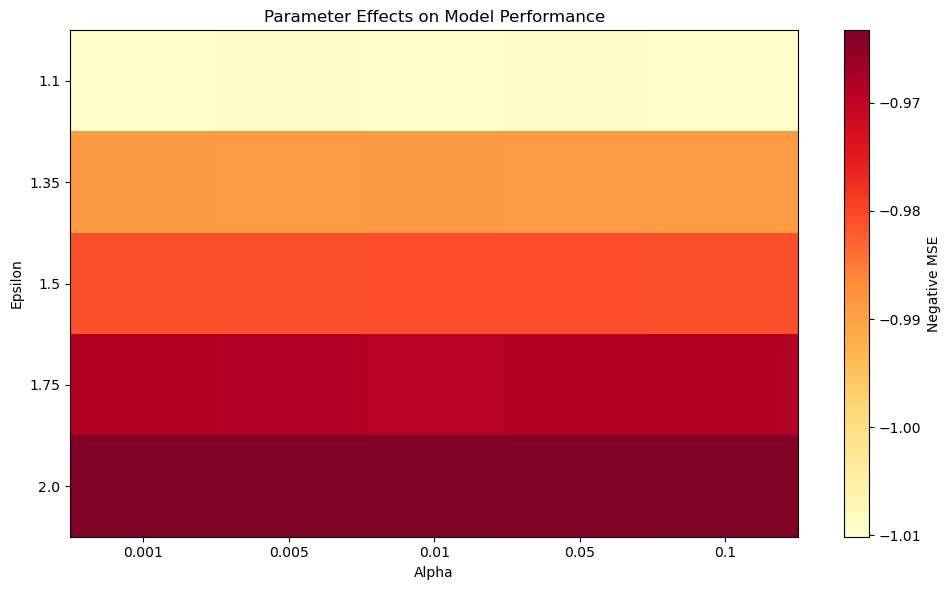


Feature Importances:
                  feature  coefficient
19          complications     0.407632
5                referral     0.213595
17             Resistance     0.199746
2                     sex    -0.134998
9              hiv_status    -0.078975
10     cormobid_condition     0.072573
6                    ward     0.063151
14      organism_isolated    -0.058481
8              sympt_dura     0.040169
18  Antibioitic_aft_cul_1    -0.037241
7        antib_prior_admi     0.033578
4        Infection_Site_2     0.014310
16           sec_organism    -0.013584
3        Infection_Site_1     0.013424
0             name_of_rrh     0.010982
15         first_organism    -0.004850
11     Prescribed_antib_1    -0.004782
12     Prescribed_antib_2     0.004558
1                     age     0.002972
13     Prescribed_antib_3    -0.000702

Cross-validation RMSE scores:
Mean RMSE: 0.9792 (+/- 0.1345)


In [128]:
from sklearn.model_selection import GridSearchCV

# Prepare the data (using log transform as before)
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])

# Define parameter grid
param_grid = {
    'epsilon': [1.1, 1.35, 1.5, 1.75, 2.0],
    'alpha': [0.001, 0.005, 0.01, 0.05, 0.1],
    'max_iter': [500]  # Fixed as it's more of a computational parameter
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(
    HuberRegressor(),
    param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=1
)

# Fit the grid search
grid_search.fit(X, y)

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score (RMSE):", np.sqrt(-grid_search.best_score_))

# Get detailed results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results = cv_results.sort_values('rank_test_score')

# Print top 5 parameter combinations
print("\nTop 5 parameter combinations:")
top_5 = cv_results[['params', 'mean_test_score', 'std_test_score']].head()
top_5['rmse'] = np.sqrt(-top_5['mean_test_score'])
print(top_5[['params', 'rmse', 'std_test_score']])

# Plot parameter effects
import matplotlib.pyplot as plt

# Create epsilon vs alpha heatmap
pivot_table = cv_results.pivot_table(
    values='mean_test_score',
    index='param_epsilon',
    columns='param_alpha'
)

plt.figure(figsize=(10, 6))
plt.imshow(pivot_table, cmap='YlOrRd', aspect='auto')
plt.colorbar(label='Negative MSE')
plt.xticks(range(len(param_grid['alpha'])), param_grid['alpha'])
plt.yticks(range(len(param_grid['epsilon'])), param_grid['epsilon'])
plt.xlabel('Alpha')
plt.ylabel('Epsilon')
plt.title('Parameter Effects on Model Performance')
plt.tight_layout()
plt.show()

# Train final model with best parameters
best_model = HuberRegressor(**grid_search.best_params_)
best_model.fit(X, y)

# Get feature importances
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'coefficient': best_model.coef_
})
feature_importance = feature_importance.sort_values('coefficient', key=abs, ascending=False)

print("\nFeature Importances:")
print(feature_importance)

# Validate the model using cross-validation scores
from sklearn.model_selection import cross_val_score
cv_scores = cross_val_score(best_model, X, y, cv=5, scoring='neg_mean_squared_error')
rmse_scores = np.sqrt(-cv_scores)

print("\nCross-validation RMSE scores:")
print(f"Mean RMSE: {rmse_scores.mean():.4f} (+/- {rmse_scores.std() * 2:.4f})")

# Random Forest Regressor


/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run casual-squid-490 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/3506097b35cb48f4b275b2cbdccfc815
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
Mean Absolute Error: 13.43
Root Mean Squared Error: 21.97
R-squared Score: 0.1252


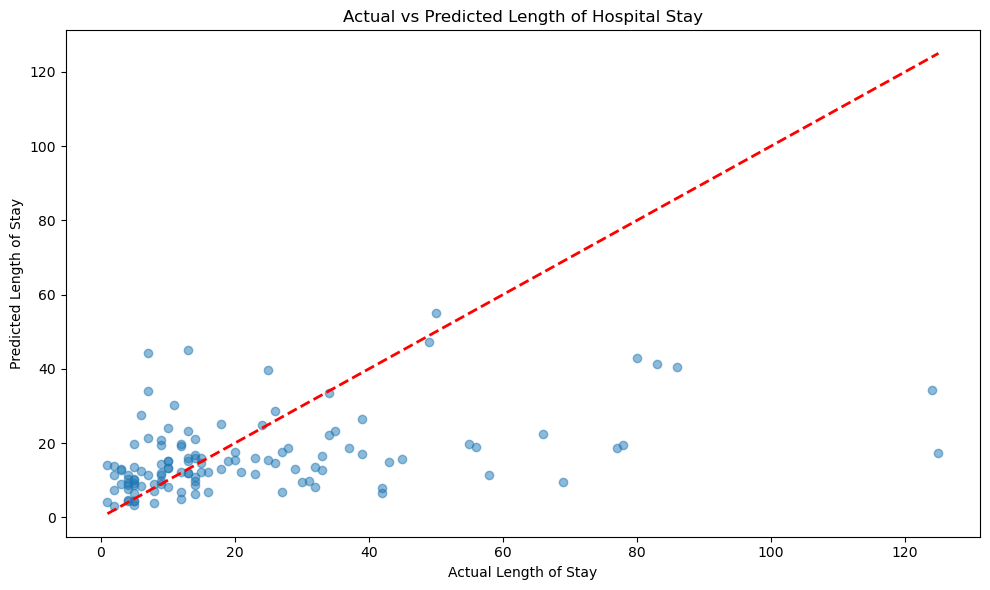

In [129]:
import mlflow
from mlflow.models import infer_signature
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Apply log transformation to the target variable
#X = data.drop(columns='length_hosp_stay')
X = data[[
    'age', 'name_of_rrh', 'Antibioitic_aft_cul_1', 'first_organism',
    'Infection_Site_1', 'Resistance', 'organism_isolated', 'ward',
    'complications', 'Prescribed_antib_2', 'Infection_Site_2',
    'Prescribed_antib_1', 'hiv_status', 'sympt_dura', 'antib_prior_admi',
    'sex',  #'sec_organism', 'cormobid_condition', 'referral'
]]
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters
params = {
    'random_state':42,
    'n_estimators': 2000, 
    'min_samples_split': 12, 
    'min_samples_leaf': 4, 
    'max_features': 0.8, 
    'max_depth': 8, 
    'bootstrap': False
}

rf = RandomForestRegressor(**params)
rf.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = rf.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(rf, "Rf_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()], 
         [y_test_original.min(), y_test_original.max()], 
         'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay')
plt.tight_layout()
plt.show()

In [130]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow RandomForest Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "Random Forest Regressor model")

    # Infer the model signature
    signature = infer_signature(X_train, rf.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="RandomForest Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/03/06 09:18:19 WARNING mlflow.models.model: Failed to validate serving input example {
  "dataframe_split": {
    "columns": [
      "age",
      "name_of_rrh",
      "Antibioitic_aft_cul_1",
      "first_organism",
      "Infec

🏃 View run legendary-skink-469 at: http://127.0.0.1:8080/#/experiments/320510952361426209/runs/c20b5637b49b4b6488b1082574f1a9ea
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/320510952361426209


Created version '44' of model 'RandomForest Regressor model'.



Feature Importance with Best Parameters:
                  feature  importance
1             name_of_rrh    0.170153
0                     age    0.164054
5              Resistance    0.110674
4        Infection_Site_1    0.092085
11     Prescribed_antib_1    0.062920
9      Prescribed_antib_2    0.062462
2   Antibioitic_aft_cul_1    0.055299
3          first_organism    0.054221
6       organism_isolated    0.048422
10       Infection_Site_2    0.043592
12             hiv_status    0.037094
8           complications    0.026822
7                    ward    0.020822
15                    sex    0.017594
13             sympt_dura    0.016915
14       antib_prior_admi    0.016871


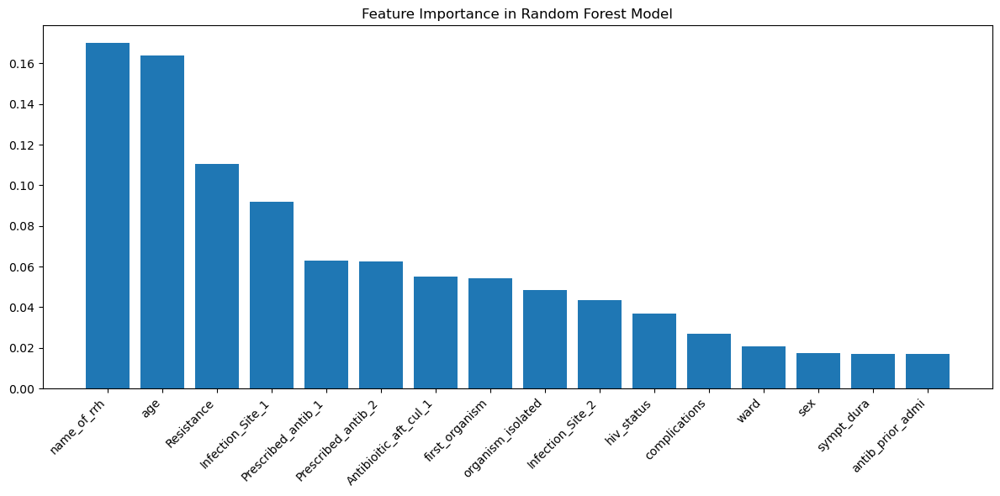

In [131]:
# Get feature importances
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': rf.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

print("\nFeature Importance with Best Parameters:")
print(feature_importance)

# Visualize feature importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance['feature'], feature_importance['importance'])
plt.xticks(rotation=45, ha='right')
plt.title('Feature Importance in Random Forest Model')
plt.tight_layout()
plt.show()

In [132]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import make_scorer, mean_squared_error
import pandas as pd

# Prepare the data
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])

# Define custom scorer for original scale RMSE
def custom_rmse_scorer(y_true, y_pred):
    return np.sqrt(mean_squared_error(np.expm1(y_true), np.expm1(y_pred)))

rmse_scorer = make_scorer(custom_rmse_scorer, greater_is_better=False)

# Define parameter distributions
param_dist = {
    'n_estimators': [500, 750, 1000, 1500],
    'max_features': [0.6, 0.7, 0.8, 0.9],
    'min_samples_split': [2, 4, 6, 8, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_depth': [None, 2, 8, 12],
    'bootstrap': [True, False]
}

# Create Random Forest model
rf = RandomForestRegressor(random_state=1)

# Perform randomized search
random_search = RandomizedSearchCV(
    rf,
    param_distributions=param_dist,
    n_iter=50,
    cv=5,
    scoring=rmse_scorer,
    n_jobs=-1,
    random_state=1,
    verbose=1
)

# Fit the random search
random_search.fit(X, y)

# Print results
print("Best parameters found:")
print(random_search.best_params_)
print("\nBest RMSE:", -random_search.best_score_)

# Get all results
results = pd.DataFrame(random_search.cv_results_)
results = results.sort_values('mean_test_score', ascending=False)

# Print top 5 combinations
print("\nTop 5 parameter combinations:")
for i in range(5):
    params = results.iloc[i]['params']
    score = -results.iloc[i]['mean_test_score']
    std = results.iloc[i]['std_test_score']
    print(f"\nRank {i+1}:")
    print(f"Parameters: {params}")
    print(f"RMSE: {score:.2f} (+/- {std*2:.2f})")

# Train best model and get feature importance
best_model = RandomForestRegressor(**random_search.best_params_, random_state=1)
best_model.fit(X, y)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters found:
{'n_estimators': 500, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.6, 'max_depth': 2, 'bootstrap': False}

Best RMSE: 35.85768153778228

Top 5 parameter combinations:

Rank 1:
Parameters: {'n_estimators': 500, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.6, 'max_depth': 2, 'bootstrap': False}
RMSE: 35.86 (+/- 38.19)

Rank 2:
Parameters: {'n_estimators': 500, 'min_samples_split': 6, 'min_samples_leaf': 1, 'max_features': 0.6, 'max_depth': 2, 'bootstrap': False}
RMSE: 35.86 (+/- 38.19)

Rank 3:
Parameters: {'n_estimators': 1000, 'min_samples_split': 4, 'min_samples_leaf': 4, 'max_features': 0.6, 'max_depth': 2, 'bootstrap': False}
RMSE: 35.86 (+/- 38.19)

Rank 4:
Parameters: {'n_estimators': 750, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 0.6, 'max_depth': 2, 'bootstrap': False}
RMSE: 35.86 (+/- 38.19)

Rank 5:
Parameters: {'n_estimators': 1000,

RandomForestRegressor(bootstrap=False, max_depth=2, max_features=0.6,
                      min_samples_leaf=4, min_samples_split=4, n_estimators=500,
                      random_state=1)

In [133]:
data.columns

Index(['name_of_rrh', 'age', 'sex', 'Infection_Site_1', 'Infection_Site_2',
       'referral', 'ward', 'antib_prior_admi', 'sympt_dura', 'hiv_status',
       'cormobid_condition', 'Prescribed_antib_1', 'Prescribed_antib_2',
       'Prescribed_antib_3', 'organism_isolated', 'first_organism',
       'sec_organism', 'Resistance', 'Antibioitic_aft_cul_1', 'complications',
       'length_hosp_stay'],
      dtype='object')

# GradientBoostingRegressor

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run intelligent-shad-283 at: http://127.0.0.1:8080/#/experiments/320510952361426209/runs/7a71872afa6d4b14a87c4d5ce91446a5
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/320510952361426209
Mean Absolute Error: 13.51
Root Mean Squared Error: 21.61
R-squared Score: 0.1537


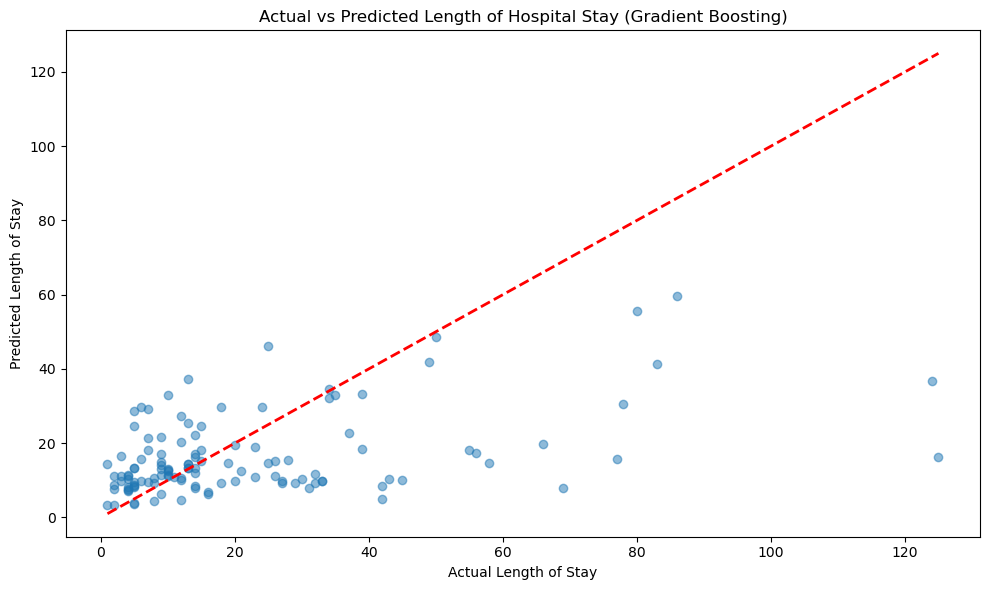

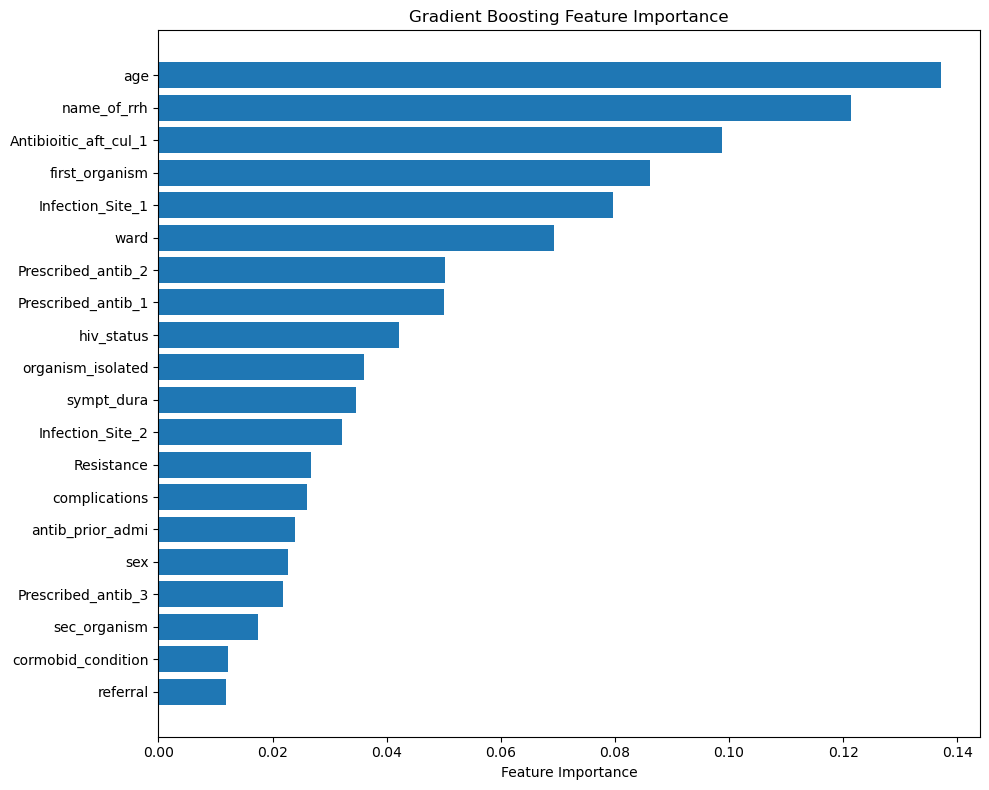

In [134]:
import mlflow
from mlflow.models import infer_signature
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Apply log transformation to the target variable
# X = data.drop(columns='length_hosp_stay')
X = data[[
    'age', 'name_of_rrh','Antibioitic_aft_cul_1',
    'first_organism', 'Infection_Site_1', 'ward',
    'Prescribed_antib_1', 'Prescribed_antib_2',
    'hiv_status', 'organism_isolated', 'sympt_dura',
    'Resistance', 'Infection_Site_2', 'complications',
    'sex', 'antib_prior_admi', 'Prescribed_antib_3',
    'sec_organism', 'cormobid_condition', 'referral' 
]]
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters for Gradient Boosting
params = {
    'random_state': 1,
    'n_estimators': 500,         # Significantly increased for better fit
    'learning_rate': 0.01,       # Further reduced for more precise corrections
    'max_depth': 6,               # Increased to capture more complex patterns
    'min_samples_split': 4,       # Minimum value to create highly specialized trees
    'min_samples_leaf': 4,        # Minimum value for maximum tree detail
    'subsample': 0.8,            # Increased to use more of the training data
    'max_features': 0.6,          # Using most features for splits
    'loss': 'huber',      # Direct optimization for MSE
    'validation_fraction': 0.2,   # For early stopping
    'n_iter_no_change': 100,      # For early stopping
    'tol': 1e-5                   # For early stopping
}

# Initialize and train the Gradient Boosting Regressor
gb = GradientBoostingRegressor(**params)
gb.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = gb.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(gb, "GB_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Gradient Boosting)')
plt.tight_layout()
plt.show()

# Feature importance plot
feature_importance = gb.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Gradient Boosting Feature Importance')
plt.tight_layout()
plt.show()

In [135]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow GB Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "GB_regressor_model")

    # Infer the model signature
    signature = infer_signature(X_train, gb.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="GB Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/03/06 09:19:05 WARNING mlflow.models.model: Failed to validate serving input example {
  "dataframe_split": {
    "columns": [
      "age",
      "name_of_rrh",
      "Antibioitic_aft_cul_1",
      "first_organism",
      "Infec

🏃 View run clumsy-newt-65 at: http://127.0.0.1:8080/#/experiments/442355567818203334/runs/d5595404a68e4705a0e3a71c70d15b12
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/442355567818203334


Created version '39' of model 'GB Regressor model'.


Starting hyperparameter tuning with RandomizedSearchCV...
Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END learning_rate=0.010699098521619942, max_depth=6, max_features=0.9692763545078751, min_samples_leaf=2, min_samples_split=13, n_estimators=3324, subsample=0.8852444528883149; total time=   0.4s
[CV] END learning_rate=0.010699098521619942, max_depth=6, max_features=0.9692763545078751, min_samples_leaf=2, min_samples_split=13, n_estimators=3324, subsample=0.8852444528883149; total time=   0.4s
[CV] END learning_rate=0.010699098521619942, max_depth=6, max_features=0.9692763545078751, min_samples_leaf=2, min_samples_split=13, n_estimators=3324, subsample=0.8852444528883149; total time=   0.5s
[CV] END learning_rate=0.004745401188473625, max_depth=7, max_features=0.5917173949330818, min_samples_leaf=8, min_samples_split=14, n_estimators=2638, subsample=0.8337498258560773; total time=   0.5s
[CV] END learning_rate=0.004745401188473625, max_depth=7, max_features=0.591

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run angry-owl-980 at: http://127.0.0.1:8080/#/experiments/442355567818203334/runs/4e9e08370055471f8d95e5997bd23ba2
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/442355567818203334

Final Model Performance on Test Set:
Mean Absolute Error: 13.84
Root Mean Squared Error: 22.96
R-squared Score: 0.0446


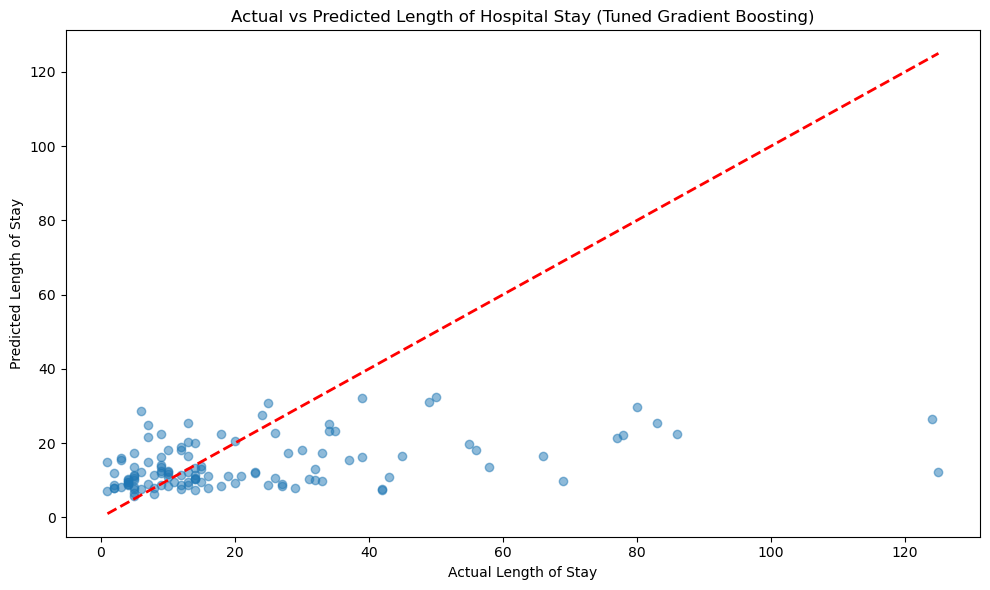

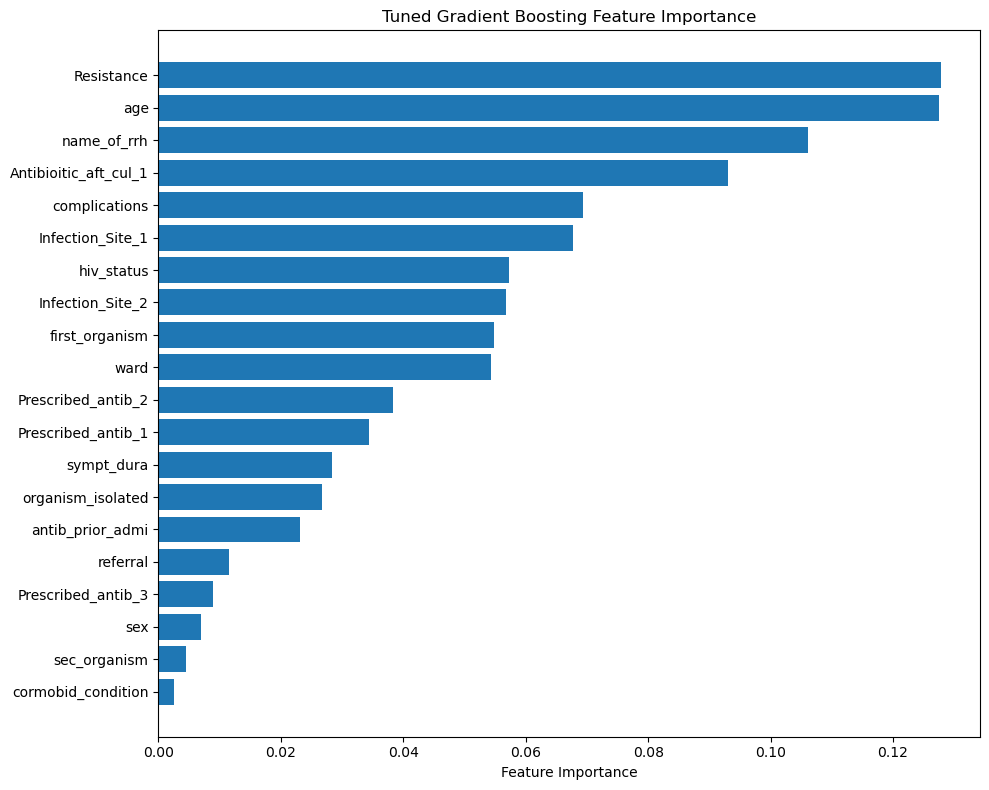

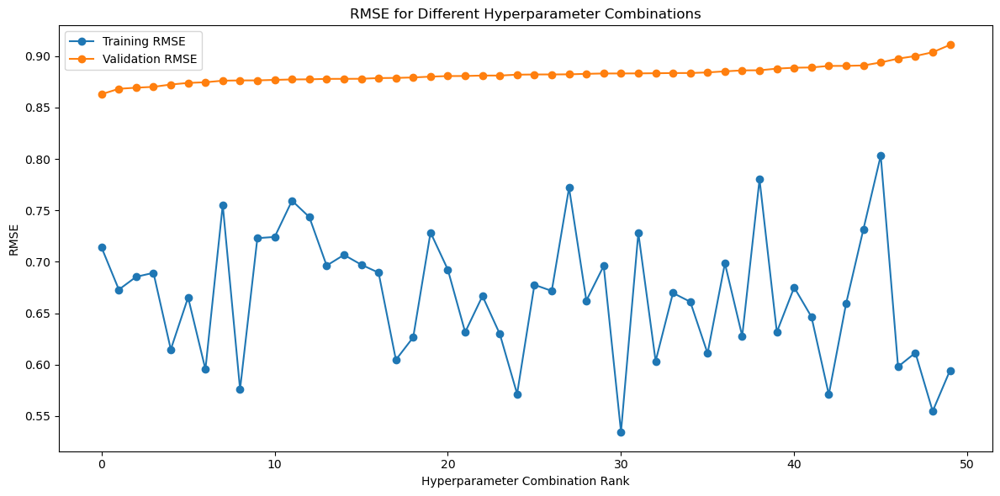

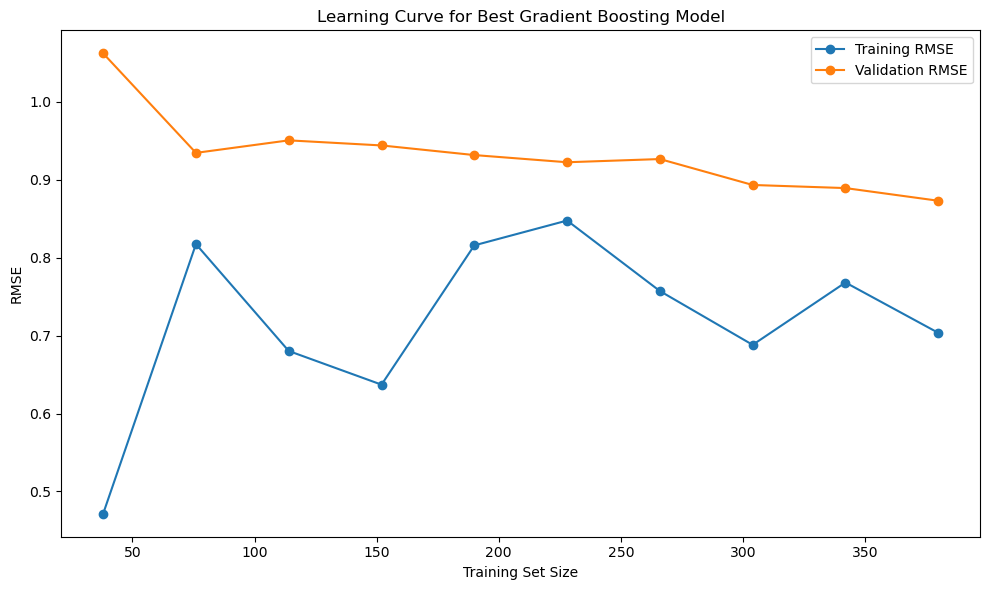

In [136]:
import mlflow
from mlflow.models import infer_signature
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV, KFold
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
from scipy.stats import randint, uniform

# Apply log transformation to the target variable
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the hyperparameter search space for Gradient Boosting
param_distributions = {
    'n_estimators': randint(1000, 3500),
    'learning_rate': uniform(0.001, 0.01),
    'max_depth': randint(3, 10),
    'min_samples_split': randint(2, 15),
    'min_samples_leaf': randint(1, 10),
    'subsample': uniform(0.7, 0.3),  # This means from 0.7 to 1.0
    'max_features': uniform(0.5, 0.5),  # This means from 0.5 to 1.0
    # 'loss': ['ls'],  # Since we're focused on squared error
}

# Initialize the base model
base_model = GradientBoostingRegressor(
    random_state=10,
    validation_fraction=0.2,
    n_iter_no_change=50,
    tol=1e-5
)

# Set up cross-validation
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Initialize RandomizedSearchCV for hyperparameter tuning
random_search = RandomizedSearchCV(
    estimator=base_model,
    param_distributions=param_distributions,
    n_iter=50,  # Number of parameter settings sampled
    cv=cv,
    scoring='neg_mean_squared_error',
    random_state=42,
    n_jobs=-1,  # Use all available processors
    verbose=2,
    return_train_score=True
)

# Perform the randomized search
print("Starting hyperparameter tuning with RandomizedSearchCV...")
random_search.fit(X_train, y_train)

# Print the best parameters and best score
print("\nBest parameters found:")
print(random_search.best_params_)
print(f"Best RMSE: {np.sqrt(-random_search.best_score_)}")

# Get the best model
best_gb = random_search.best_estimator_

# Make predictions and inverse transform them
y_pred_log = best_gb.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the best model and metrics with MLflow
with mlflow.start_run():
    # Log best parameters
    mlflow.log_params(random_search.best_params_)
    
    # Log metrics
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(best_gb, "best_GB_regressor_model", signature=signature)

# Print the metrics
print("\nFinal Model Performance on Test Set:")
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Create a scatter plot to visualize predictions vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
         [y_test_original.min(), y_test_original.max()],
         'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Tuned Gradient Boosting)')
plt.tight_layout()
plt.savefig('gb_predictions_vs_actual.png')
plt.show()

# Feature importance plot for the best model
feature_importance = best_gb.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Tuned Gradient Boosting Feature Importance')
plt.tight_layout()
plt.savefig('gb_feature_importance.png')
plt.show()

# Plot learning curves of the hyperparameter search
results = random_search.cv_results_
plt.figure(figsize=(12, 6))

# Get indices sorted by rank
sorted_indices = np.argsort(results['rank_test_score'])

# Plot the RMSE for each hyperparameter combination
train_scores = -results['mean_train_score'][sorted_indices]
test_scores = -results['mean_test_score'][sorted_indices]
plt.plot(range(len(sorted_indices)), np.sqrt(train_scores), 'o-', label='Training RMSE')
plt.plot(range(len(sorted_indices)), np.sqrt(test_scores), 'o-', label='Validation RMSE')
plt.xlabel('Hyperparameter Combination Rank')
plt.ylabel('RMSE')
plt.title('RMSE for Different Hyperparameter Combinations')
plt.legend()
plt.tight_layout()
plt.savefig('gb_hyperparameter_search_results.png')
plt.show()

# Optional: Plot learning curve of the best model
from sklearn.model_selection import learning_curve

train_sizes, train_scores, valid_scores = learning_curve(
    best_gb, X_train, y_train, 
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, scoring='neg_mean_squared_error',
    n_jobs=-1
)

# Calculate RMSE from MSE
train_rmse = np.sqrt(-np.mean(train_scores, axis=1))
valid_rmse = np.sqrt(-np.mean(valid_scores, axis=1))

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_rmse, 'o-', label='Training RMSE')
plt.plot(train_sizes, valid_rmse, 'o-', label='Validation RMSE')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.title('Learning Curve for Best Gradient Boosting Model')
plt.legend()
plt.tight_layout()
plt.savefig('gb_learning_curve.png')
plt.show()

# Light gbm regressor

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 20
[LightGBM] [Info] Start training from score 2.645756
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run crawling-mole-675 at: http://127.0.0.1:8080/#/experiments/442355567818203334/runs/0ddb5bf4e4174055900ebd6f529c713e
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/442355567818203334
Mean Absolute Error: 14.40
Root Mean Squared Error: 22.84
R-squared Score: 0.0546


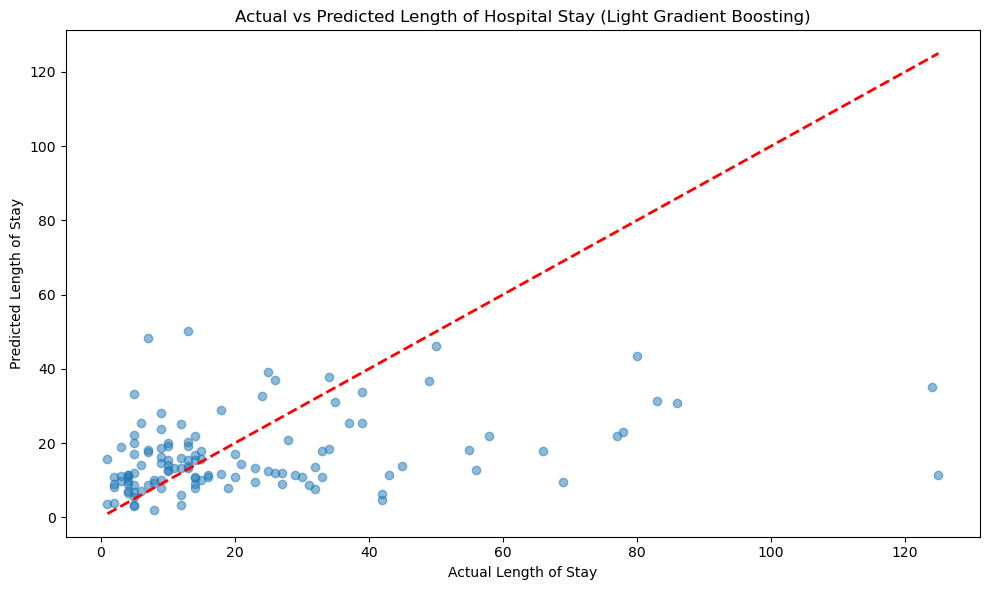

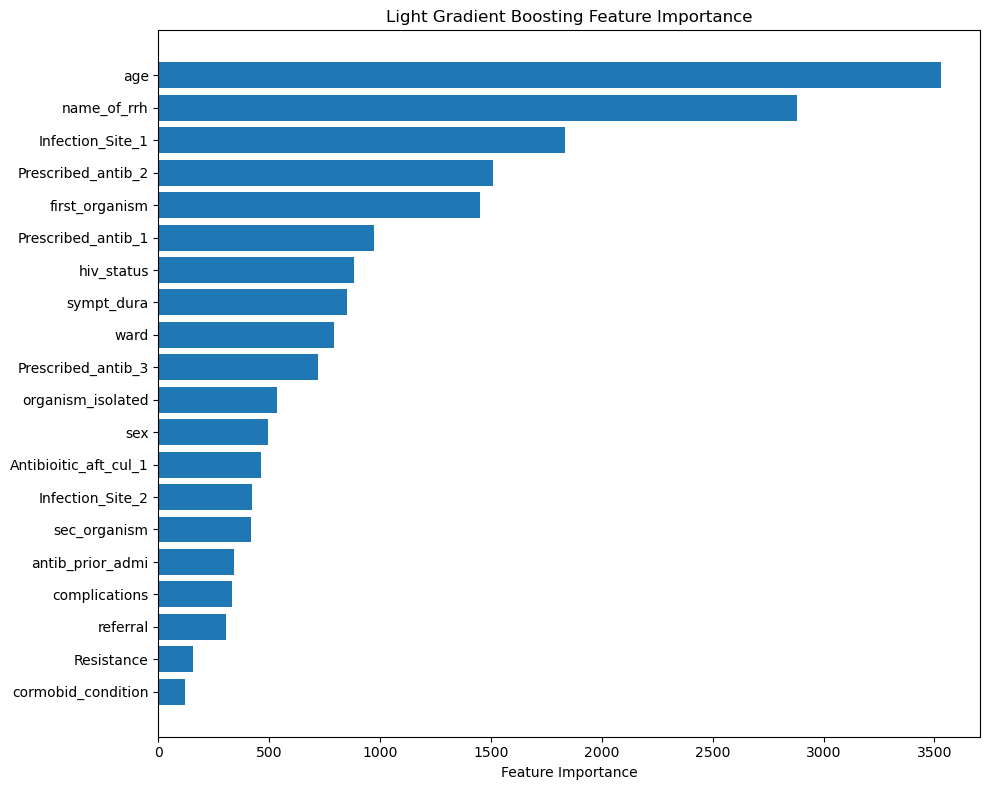

In [137]:
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Apply log transformation to the target variable
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters for Light Gradient Boosting
params = {
    'objective' : 'regression',
    'random_state': 10,
    'n_estimators': 2500,         # Significantly increased for better fit
    'learning_rate': 0.005,       # Further reduced for more precise corrections
    'max_depth': 4,               # Increased to capture more complex patterns
    'num_leaves': 85, 
    'boosting_type' : 'gbdt',
    'subsample_for_bin'  : 25000               
}

# Initialize and train the Light Gradient Boosting Regressor
lgbm = LGBMRegressor(**params)
lgbm.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = lgbm.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(lgbm, "LGBM_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Light Gradient Boosting)')
plt.tight_layout()
plt.show()

# Feature importance plot
feature_importance = lgbm.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Light Gradient Boosting Feature Importance')
plt.tight_layout()
plt.show()

In [138]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow LGBM Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "LGBM_regressor_model")

    # Infer the model signature
    signature = infer_signature(X_train, lgbm.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="LGBM Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'LGBM Regressor model' already exists. Creating a new version of this model...
2025/03/06 09:19:44 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Mode

🏃 View run abrasive-sow-948 at: http://127.0.0.1:8080/#/experiments/822887533196691341/runs/9c9829616acc449d9de8d15018047580
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/822887533196691341


Created version '19' of model 'LGBM Regressor model'.


In [139]:
import optuna

# Ensure growth is defined
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])  

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define objective function for Optuna
def objective(trial):
    params = {
        'objective': 'regression',
        'boosting_type': 'gbdt',
        'random_state': 10,
        'n_estimators': trial.suggest_int('n_estimators', 1000, 3000, step=500),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.02, log=True),
        'max_depth': trial.suggest_int('max_depth', 2, 10),
        'num_leaves': trial.suggest_int('num_leaves', 20, 150, step=10),
        'subsample_for_bin': trial.suggest_int('subsample_for_bin', 20000, 50000, step=5000),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 50, step=5),
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 10.0, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 10.0, log=True),
    }

    # Train model
    lgbm = LGBMRegressor(**params)
    lgbm.fit(X_train, y_train, eval_set=[(X_test, y_test)])
    
    # Predict and evaluate
    y_pred_log = lgbm.predict(X_test)
    y_pred = np.expm1(y_pred_log)
    y_test_original = np.expm1(y_test)
    
    mae = mean_absolute_error(y_test_original, y_pred)
    return mae  # Minimizing MAE

# Run Optuna optimization
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50)

# Get best hyperparameters
best_params = study.best_params
print("Best hyperparameters:", best_params)

# Train final model with best parameters
lgbm_final = LGBMRegressor(**best_params)
lgbm_final.fit(X_train, y_train)

# Evaluate on test set
y_pred_log = lgbm_final.predict(X_test)
y_pred = np.expm1(y_pred_log)
y_test_original = np.expm1(y_test)

mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log best model with MLflow
with mlflow.start_run():
    mlflow.log_params(best_params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    mlflow.sklearn.log_model(lgbm_final, "LGBM_regressor_optimized")

# Print final metrics
print(f"Optimized Mean Absolute Error: {mae:.2f}")
print(f"Optimized Root Mean Squared Error: {rmse:.2f}")
print(f"Optimized R-squared Score: {r2:.4f}")

[I 2025-03-06 09:19:44,135] A new study created in memory with name: no-name-ab777500-98da-4d0f-bf6a-4be4cabecd7e


[LightGBM] [Warning] lambda_l2 is set=0.060872454058214044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.060872454058214044
[LightGBM] [Warning] lambda_l1 is set=4.3183384741550295e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3183384741550295e-05
[LightGBM] [Warning] lambda_l2 is set=0.060872454058214044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.060872454058214044
[LightGBM] [Warning] lambda_l1 is set=4.3183384741550295e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3183384741550295e-05
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 199
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 20
[LightGBM] [Warning] lambda_l2 is set=0.060872454058214044, reg_lambda=0.0 will be ignored. 

[I 2025-03-06 09:19:48,250] Trial 0 finished with value: 14.164754613720293 and parameters: {'n_estimators': 2000, 'learning_rate': 0.013737503210767226, 'max_depth': 5, 'num_leaves': 130, 'subsample_for_bin': 50000, 'min_child_samples': 5, 'lambda_l1': 4.3183384741550295e-05, 'lambda_l2': 0.060872454058214044}. Best is trial 0 with value: 14.164754613720293.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.060872454058214044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.060872454058214044
[LightGBM] [Warning] lambda_l1 is set=4.3183384741550295e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3183384741550295e-05
[LightGBM] [Warning] lambda_l2 is set=1.9772201421300347e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9772201421300347e-06
[LightGBM] [Warning] lambda_l1 is set=2.883261512642955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.883261512642955
[LightGBM] [Warning] lambda_l2 is set=1.9772201421300347e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9772201421300347e-06
[LightGBM] [Warning] lambda_l1 is set=2.883261512642955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.883261512642955
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000434 secon

[I 2025-03-06 09:19:50,523] Trial 1 finished with value: 13.988502814157503 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0011059597710272784, 'max_depth': 10, 'num_leaves': 40, 'subsample_for_bin': 50000, 'min_child_samples': 30, 'lambda_l1': 2.883261512642955, 'lambda_l2': 1.9772201421300347e-06}. Best is trial 1 with value: 13.988502814157503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:19:51,804] Trial 2 finished with value: 13.593266135024313 and parameters: {'n_estimators': 1000, 'learning_rate': 0.005445254130220741, 'max_depth': 6, 'num_leaves': 90, 'subsample_for_bin': 20000, 'min_child_samples': 30, 'lambda_l1': 6.595805417743891e-08, 'lambda_l2': 8.314357539128125}. Best is trial 2 with value: 13.593266135024313.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=8.314357539128125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.314357539128125
[LightGBM] [Warning] lambda_l1 is set=6.595805417743891e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.595805417743891e-08
[LightGBM] [Warning] lambda_l2 is set=0.01011638116165113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01011638116165113
[LightGBM] [Warning] lambda_l1 is set=0.000325993773540944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000325993773540944
[LightGBM] [Warning] lambda_l2 is set=0.01011638116165113, reg_lambda=0.0 will be

[I 2025-03-06 09:19:55,200] Trial 3 finished with value: 14.111163187159043 and parameters: {'n_estimators': 1000, 'learning_rate': 0.010333831113331493, 'max_depth': 9, 'num_leaves': 150, 'subsample_for_bin': 40000, 'min_child_samples': 10, 'lambda_l1': 0.000325993773540944, 'lambda_l2': 0.01011638116165113}. Best is trial 2 with value: 13.593266135024313.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:19:57,274] Trial 4 finished with value: 13.958896342349313 and parameters: {'n_estimators': 2000, 'learning_rate': 0.0023782927176257927, 'max_depth': 4, 'num_leaves': 140, 'subsample_for_bin': 25000, 'min_child_samples': 25, 'lambda_l1': 0.0409739853208353, 'lambda_l2': 4.3330354467931675}. Best is trial 2 with value: 13.593266135024313.


[LightGBM] [Warning] lambda_l2 is set=4.3330354467931675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3330354467931675
[LightGBM] [Warning] lambda_l1 is set=0.0409739853208353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0409739853208353
[LightGBM] [Warning] lambda_l2 is set=0.12283733755282847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12283733755282847
[LightGBM] [Warning] lambda_l1 is set=0.00015930347222009448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015930347222009448
[LightGBM] [Warning] lambda_l2 is set=0.12283733755282847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12283733755282847
[LightGBM] [Warning] lambda_l1 is set=0.00015930347222009448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015930347222009448
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000502 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is 

[I 2025-03-06 09:19:58,818] Trial 5 finished with value: 13.77720298592793 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0014480151870874926, 'max_depth': 5, 'num_leaves': 60, 'subsample_for_bin': 45000, 'min_child_samples': 50, 'lambda_l1': 0.00015930347222009448, 'lambda_l2': 0.12283733755282847}. Best is trial 2 with value: 13.593266135024313.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:20:04,113] Trial 6 finished with value: 13.563400413938982 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0010633510388218833, 'max_depth': 6, 'num_leaves': 30, 'subsample_for_bin': 25000, 'min_child_samples': 5, 'lambda_l1': 0.006245427361016378, 'lambda_l2': 0.1632620082921855}. Best is trial 6 with value: 13.563400413938982.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.1632620082921855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1632620082921855
[LightGBM] [Warning] lambda_l1 is set=0.006245427361016378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006245427361016378
[LightGBM] [Warning] lambda_l2 is set=0.8281321363908069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8281321363908069
[LightGBM] [Warning] lambda_l1 is set=0.43041642028250454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43041642028250454
[LightGBM] [Warning] lambda_l2 is set=0.8281321363908069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8281321363908069
[LightGBM] [Warning] lambd

[I 2025-03-06 09:20:05,616] Trial 7 finished with value: 13.680304105778564 and parameters: {'n_estimators': 1500, 'learning_rate': 0.008825809432132882, 'max_depth': 5, 'num_leaves': 90, 'subsample_for_bin': 20000, 'min_child_samples': 50, 'lambda_l1': 0.43041642028250454, 'lambda_l2': 0.8281321363908069}. Best is trial 6 with value: 13.563400413938982.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:20:06,618] Trial 8 finished with value: 13.69093851964816 and parameters: {'n_estimators': 1000, 'learning_rate': 0.0041854065117023385, 'max_depth': 4, 'num_leaves': 20, 'subsample_for_bin': 45000, 'min_child_samples': 40, 'lambda_l1': 3.799359720177502e-07, 'lambda_l2': 4.62686570280978e-08}. Best is trial 6 with value: 13.563400413938982.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:20:07,535] Trial 9 finished with value: 13.648065493380193 and parameters: {'n_estimators': 1000, 'learning_rate': 0.008803927947621745, 'max_depth': 4, 'num_leaves': 20, 'subsample_for_bin': 35000, 'min_child_samples': 50, 'lambda_l1': 0.0005562720942265698, 'lambda_l2': 0.38621865117698817}. Best is trial 6 with value: 13.563400413938982.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:20:15,248] Trial 10 finished with value: 13.251873234411361 and parameters: {'n_estimators': 3000, 'learning_rate': 0.002097221824438907, 'max_depth': 8, 'num_leaves': 60, 'subsample_for_bin': 30000, 'min_child_samples': 15, 'lambda_l1': 0.02240611009252513, 'lambda_l2': 0.0007140599503064821}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.0007140599503064821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007140599503064821
[LightGBM] [Warning] lambda_l1 is set=0.02240611009252513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02240611009252513
[LightGBM] [Warning] lambda_l2 is set=0.00037290731347573936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00037290731347573936
[LightGBM] [Warning] lambda_l1 is set=0.01970339546301132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01970339546301132
[LightGBM] [Warning] lambda_l2 is set=0.00037290731347573936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00037290731347573936
[LightGBM] [Warning] lambda_l1 is set=0.01970339546301132, reg_alpha=0.0 will be 

[I 2025-03-06 09:20:22,735] Trial 11 finished with value: 13.44296922885551 and parameters: {'n_estimators': 3000, 'learning_rate': 0.002008079135482835, 'max_depth': 8, 'num_leaves': 60, 'subsample_for_bin': 30000, 'min_child_samples': 15, 'lambda_l1': 0.01970339546301132, 'lambda_l2': 0.00037290731347573936}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.00037290731347573936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00037290731347573936
[LightGBM] [Warning] lambda_l1 is set=0.01970339546301132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01970339546301132
[LightGBM] [Warning] lambda_l2 is set=0.000199974739805693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.000199974739805693
[LightGBM] [Warning] lambda_l1 is set=0.035464788012778956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.035464788012778956
[LightGBM] [Warning] lambda_l2 is set=0.000199974739805693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.000199974739805693
[LightGBM]

[I 2025-03-06 09:20:29,459] Trial 12 finished with value: 13.636990496091377 and parameters: {'n_estimators': 3000, 'learning_rate': 0.002245444395040329, 'max_depth': 8, 'num_leaves': 60, 'subsample_for_bin': 30000, 'min_child_samples': 15, 'lambda_l1': 0.035464788012778956, 'lambda_l2': 0.000199974739805693}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:20:35,200] Trial 13 finished with value: 13.742692587488898 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0024327705399210062, 'max_depth': 8, 'num_leaves': 60, 'subsample_for_bin': 35000, 'min_child_samples': 20, 'lambda_l1': 4.451729057499258e-06, 'lambda_l2': 0.0004049032066518575}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] lambda_l2 is set=0.0004049032066518575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0004049032066518575
[LightGBM] [Warning] lambda_l1 is set=4.451729057499258e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.451729057499258e-06
[LightGBM] [Warning] lambda_l2 is set=9.082198467041545e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.082198467041545e-05
[LightGBM] [Warning] lambda_l1 is set=0.003924053232136612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003924053232136612
[LightGBM] [Warning] lambda_l2 is set=9.082198467041545e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.082198467041545e-05
[LightGBM] [Warning] lambda_l1 is set=0.003924053232136612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003924053232136612
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_row_wise=true` to remove the overhead.
And i

[I 2025-03-06 09:20:36,907] Trial 14 finished with value: 13.626359915104956 and parameters: {'n_estimators': 2500, 'learning_rate': 0.003754345838280443, 'max_depth': 2, 'num_leaves': 80, 'subsample_for_bin': 30000, 'min_child_samples': 15, 'lambda_l1': 0.003924053232136612, 'lambda_l2': 9.082198467041545e-05}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:20:40,748] Trial 15 finished with value: 13.737789815241097 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0015920179932069935, 'max_depth': 8, 'num_leaves': 120, 'subsample_for_bin': 30000, 'min_child_samples': 20, 'lambda_l1': 9.695313354919461, 'lambda_l2': 9.016534532367125e-06}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:20:47,591] Trial 16 finished with value: 13.552761167191834 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0031109280015065906, 'max_depth': 10, 'num_leaves': 110, 'subsample_for_bin': 25000, 'min_child_samples': 15, 'lambda_l1': 0.18547046499689276, 'lambda_l2': 0.00206577618036234}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.00206577618036234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00206577618036234
[LightGBM] [Warning] lambda_l1 is set=0.18547046499689276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18547046499689276
[LightGBM] [Warning] lambda_l2 is set=9.042131672548684e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.042131672548684e-06
[LightGBM] [Warning] lambda_l1 is set=0.0032325177391295443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032325177391295443
[LightGBM] [Warning] lambda_l2 is set=9.042131672548684e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.042131672548684e-06
[LightGBM]

[I 2025-03-06 09:20:51,431] Trial 17 finished with value: 14.6824775771734 and parameters: {'n_estimators': 3000, 'learning_rate': 0.006224775229773735, 'max_depth': 7, 'num_leaves': 50, 'subsample_for_bin': 40000, 'min_child_samples': 35, 'lambda_l1': 0.0032325177391295443, 'lambda_l2': 9.042131672548684e-06}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:21:00,146] Trial 18 finished with value: 13.551983821186251 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0017292737668399725, 'max_depth': 9, 'num_leaves': 80, 'subsample_for_bin': 30000, 'min_child_samples': 10, 'lambda_l1': 1.1793015891566558e-05, 'lambda_l2': 0.004775958921947303}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] lambda_l2 is set=0.004775958921947303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004775958921947303
[LightGBM] [Warning] lambda_l1 is set=1.1793015891566558e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1793015891566558e-05
[LightGBM] [Warning] lambda_l2 is set=4.5075770042680044e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5075770042680044e-07
[LightGBM] [Warning] lambda_l1 is set=0.2704182826398802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2704182826398802
[LightGBM] [Warning] lambda_l2 is set=4.5075770042680044e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5075770042680044e-07
[LightGBM] [Warning] lambda_l1 is set=0.2704182826398802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2704182826398802
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002267 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if me

[I 2025-03-06 09:21:05,131] Trial 19 finished with value: 13.949991983531154 and parameters: {'n_estimators': 3000, 'learning_rate': 0.002916001326459198, 'max_depth': 7, 'num_leaves': 70, 'subsample_for_bin': 40000, 'min_child_samples': 25, 'lambda_l1': 0.2704182826398802, 'lambda_l2': 4.5075770042680044e-07}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:21:11,000] Trial 20 finished with value: 13.713985195759665 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0019032571075281017, 'max_depth': 9, 'num_leaves': 100, 'subsample_for_bin': 35000, 'min_child_samples': 20, 'lambda_l1': 1.2879295227190284, 'lambda_l2': 3.391151821366353e-05}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:21:20,428] Trial 21 finished with value: 13.563397379560687 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0014845395336577272, 'max_depth': 9, 'num_leaves': 80, 'subsample_for_bin': 30000, 'min_child_samples': 10, 'lambda_l1': 1.3873877740883684e-05, 'lambda_l2': 0.00303286072469458}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] lambda_l2 is set=0.00303286072469458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00303286072469458
[LightGBM] [Warning] lambda_l1 is set=1.3873877740883684e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3873877740883684e-05
[LightGBM] [Warning] lambda_l2 is set=0.013357003599279216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013357003599279216
[LightGBM] [Warning] lambda_l1 is set=1.9729612004222293e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9729612004222293e-06
[LightGBM] [Warning] lambda_l2 is set=0.013357003599279216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013357003599279216
[LightGBM] [Warning] lambda_l1 is set=1.9729612004222293e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9729612004222293e-06
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And

[I 2025-03-06 09:21:26,819] Trial 22 finished with value: 13.631347677338836 and parameters: {'n_estimators': 2500, 'learning_rate': 0.001850192223484578, 'max_depth': 7, 'num_leaves': 40, 'subsample_for_bin': 25000, 'min_child_samples': 10, 'lambda_l1': 1.9729612004222293e-06, 'lambda_l2': 0.013357003599279216}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:21:43,020] Trial 23 finished with value: 13.679717865142841 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0012568422383458077, 'max_depth': 9, 'num_leaves': 70, 'subsample_for_bin': 35000, 'min_child_samples': 5, 'lambda_l1': 1.1814889459722915e-08, 'lambda_l2': 0.000586293049401585}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] lambda_l2 is set=0.000586293049401585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.000586293049401585
[LightGBM] [Warning] lambda_l1 is set=1.1814889459722915e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1814889459722915e-08
[LightGBM] [Warning] lambda_l2 is set=0.0017362537412022958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0017362537412022958
[LightGBM] [Warning] lambda_l1 is set=0.014385136740203034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014385136740203034
[LightGBM] [Warning] lambda_l2 is set=0.0017362537412022958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0017362537412022958
[LightGBM] [Warning] lambda_l1 is set=0.014385136740203034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014385136740203034
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And i

[I 2025-03-06 09:21:47,189] Trial 24 finished with value: 13.418708889908366 and parameters: {'n_estimators': 2000, 'learning_rate': 0.0032071057138592144, 'max_depth': 8, 'num_leaves': 50, 'subsample_for_bin': 30000, 'min_child_samples': 15, 'lambda_l1': 0.014385136740203034, 'lambda_l2': 0.0017362537412022958}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:21:50,824] Trial 25 finished with value: 13.498869163361878 and parameters: {'n_estimators': 2000, 'learning_rate': 0.0031461345535955597, 'max_depth': 8, 'num_leaves': 40, 'subsample_for_bin': 25000, 'min_child_samples': 20, 'lambda_l1': 0.02673812038715203, 'lambda_l2': 0.0008531039351931471}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:21:54,704] Trial 26 finished with value: 13.62803223833306 and parameters: {'n_estimators': 2000, 'learning_rate': 0.003680485429744109, 'max_depth': 7, 'num_leaves': 50, 'subsample_for_bin': 35000, 'min_child_samples': 15, 'lambda_l1': 0.0008980927133764524, 'lambda_l2': 3.9904715565997294e-05}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:21:57,543] Trial 27 finished with value: 14.115634698290625 and parameters: {'n_estimators': 2000, 'learning_rate': 0.005258247491675735, 'max_depth': 6, 'num_leaves': 50, 'subsample_for_bin': 30000, 'min_child_samples': 25, 'lambda_l1': 0.014246426148955773, 'lambda_l2': 0.026124065035000393}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:22:03,974] Trial 28 finished with value: 13.684888534494664 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0026456794086592407, 'max_depth': 10, 'num_leaves': 70, 'subsample_for_bin': 20000, 'min_child_samples': 15, 'lambda_l1': 0.10474074232989773, 'lambda_l2': 0.001344351218344007}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lamb

[I 2025-03-06 09:22:10,183] Trial 29 finished with value: 14.421199687472251 and parameters: {'n_estimators': 2000, 'learning_rate': 0.01764306000240858, 'max_depth': 8, 'num_leaves': 30, 'subsample_for_bin': 25000, 'min_child_samples': 5, 'lambda_l1': 8.21350635489083e-05, 'lambda_l2': 0.04628352874718381}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.04628352874718381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04628352874718381
[LightGBM] [Warning] lambda_l1 is set=8.21350635489083e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.21350635489083e-05
[LightGBM] [Warning] lambda_l2 is set=0.00015209125438070542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00015209125438070542
[LightGBM] [Warning] lambda_l1 is set=0.0016014496249351705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016014496249351705
[LightGBM] [Warning] lambda_l2 is set=0.00015209125438070542, reg_lambd

[I 2025-03-06 09:22:15,171] Trial 30 finished with value: 13.595740081516597 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0020919272179822424, 'max_depth': 7, 'num_leaves': 60, 'subsample_for_bin': 30000, 'min_child_samples': 20, 'lambda_l1': 0.0016014496249351705, 'lambda_l2': 0.00015209125438070542}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] lambda_l2 is set=0.00015209125438070542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00015209125438070542
[LightGBM] [Warning] lambda_l1 is set=0.0016014496249351705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016014496249351705
[LightGBM] [Warning] lambda_l2 is set=0.001015180342280221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001015180342280221
[LightGBM] [Warning] lambda_l1 is set=0.0165650610326669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0165650610326669
[LightGBM] [Warning] lambda_l2 is set=0.001015180342280221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001015180342280221
[LightGBM] [Warning] lambda_l1 is set=0.0165650610326669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0165650610326669
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory i

[I 2025-03-06 09:22:18,934] Trial 31 finished with value: 13.584370470150578 and parameters: {'n_estimators': 2000, 'learning_rate': 0.0031131365904376465, 'max_depth': 8, 'num_leaves': 40, 'subsample_for_bin': 25000, 'min_child_samples': 20, 'lambda_l1': 0.0165650610326669, 'lambda_l2': 0.001015180342280221}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:22:24,155] Trial 32 finished with value: 13.565894588301765 and parameters: {'n_estimators': 2000, 'learning_rate': 0.003606858297325218, 'max_depth': 8, 'num_leaves': 30, 'subsample_for_bin': 25000, 'min_child_samples': 10, 'lambda_l1': 0.0548557217780123, 'lambda_l2': 1.018591646910108e-05}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=1.018591646910108e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.018591646910108e-05
[LightGBM] [Warning] lambda_l1 is set=0.0548557217780123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0548557217780123
[LightGBM] [Warning] lambda_l2 is set=0.007687718908550374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007687718908550374
[LightGBM] [Warning] lambda_l1 is set=1.041903702782425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.041903702782425
[LightGBM] [Warning] lambda_l2 is set=0.007687718908550374, reg_lambda=0.0 will be 

[I 2025-03-06 09:22:26,075] Trial 33 finished with value: 13.646702314879386 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0028095021254226937, 'max_depth': 6, 'num_leaves': 50, 'subsample_for_bin': 20000, 'min_child_samples': 30, 'lambda_l1': 1.041903702782425, 'lambda_l2': 0.007687718908550374}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:22:31,421] Trial 34 finished with value: 13.645862492631128 and parameters: {'n_estimators': 2000, 'learning_rate': 0.00498241553605754, 'max_depth': 10, 'num_leaves': 40, 'subsample_for_bin': 30000, 'min_child_samples': 15, 'lambda_l1': 0.013993347833134166, 'lambda_l2': 5.215336966279893e-05}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] lambda_l2 is set=5.215336966279893e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.215336966279893e-05
[LightGBM] [Warning] lambda_l1 is set=0.013993347833134166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013993347833134166
[LightGBM] [Warning] lambda_l2 is set=0.0005113436863695691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005113436863695691
[LightGBM] [Warning] lambda_l1 is set=0.07810057391425343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07810057391425343
[LightGBM] [Warning] lambda_l2 is set=0.0005113436863695691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005113436863695691
[LightGBM] [Warning] lambda_l1 is set=0.07810057391425343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07810057391425343
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memo

[I 2025-03-06 09:22:36,952] Trial 35 finished with value: 13.62260100068657 and parameters: {'n_estimators': 2500, 'learning_rate': 0.006837051064035315, 'max_depth': 9, 'num_leaves': 70, 'subsample_for_bin': 25000, 'min_child_samples': 20, 'lambda_l1': 0.07810057391425343, 'lambda_l2': 0.0005113436863695691}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.0005113436863695691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005113436863695691
[LightGBM] [Warning] lambda_l1 is set=0.07810057391425343, reg_alpha=0.0 will be ignored. Current value: lambd

[I 2025-03-06 09:22:40,017] Trial 36 finished with value: 13.763464077710829 and parameters: {'n_estimators': 1500, 'learning_rate': 0.00447203750142766, 'max_depth': 7, 'num_leaves': 50, 'subsample_for_bin': 35000, 'min_child_samples': 25, 'lambda_l1': 0.001845303760607467, 'lambda_l2': 0.002372945887777463}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:22:42,983] Trial 37 finished with value: 14.039717376642447 and parameters: {'n_estimators': 2000, 'learning_rate': 0.0013578970383167914, 'max_depth': 8, 'num_leaves': 40, 'subsample_for_bin': 20000, 'min_child_samples': 35, 'lambda_l1': 0.00020281204049814224, 'lambda_l2': 0.014898455425293979}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:22:48,752] Trial 38 finished with value: 13.764198498218517 and parameters: {'n_estimators': 2000, 'learning_rate': 0.0021985077462806832, 'max_depth': 6, 'num_leaves': 30, 'subsample_for_bin': 40000, 'min_child_samples': 10, 'lambda_l1': 0.008598772156637936, 'lambda_l2': 0.00017070670055511065}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:22:49,672] Trial 39 finished with value: 14.131653574859344 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0012046712030196786, 'max_depth': 2, 'num_leaves': 60, 'subsample_for_bin': 30000, 'min_child_samples': 25, 'lambda_l1': 4.914560182601179, 'lambda_l2': 1.0081052566648276e-06}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:22:56,665] Trial 40 finished with value: 13.56596541477566 and parameters: {'n_estimators': 2500, 'learning_rate': 0.00346452442155647, 'max_depth': 10, 'num_leaves': 90, 'subsample_for_bin': 50000, 'min_child_samples': 15, 'lambda_l1': 0.5474997540572402, 'lambda_l2': 0.09749967369994324}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:23:07,796] Trial 41 finished with value: 13.396280734199825 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0017168708433352203, 'max_depth': 9, 'num_leaves': 80, 'subsample_for_bin': 30000, 'min_child_samples': 10, 'lambda_l1': 2.6982802954339585e-05, 'lambda_l2': 0.006770860091342278}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] lambda_l2 is set=0.006770860091342278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006770860091342278
[LightGBM] [Warning] lambda_l1 is set=2.6982802954339585e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6982802954339585e-05
[LightGBM] [Warning] lambda_l2 is set=0.0008621254637012176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008621254637012176
[LightGBM] [Warning] lambda_l1 is set=4.462982925276037e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.462982925276037e-05
[LightGBM] [Warning] lambda_l2 is set=0.0008621254637012176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008621254637012176
[LightGBM] [Warning] lambda_l1 is set=4.462982925276037e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.462982925276037e-05
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001793 seconds.
You can set `force_row_wise=true` to remove the overhead.
A

[I 2025-03-06 09:23:24,745] Trial 42 finished with value: 13.940408920819895 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0019566438878143464, 'max_depth': 9, 'num_leaves': 70, 'subsample_for_bin': 25000, 'min_child_samples': 5, 'lambda_l1': 4.462982925276037e-05, 'lambda_l2': 0.0008621254637012176}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] lambda_l2 is set=0.0008621254637012176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008621254637012176
[LightGBM] [Warning] lambda_l1 is set=4.462982925276037e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.462982925276037e-05
[LightGBM] [Warning] lambda_l2 is set=0.005926222188077151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005926222188077151
[LightGBM] [Warning] lambda_l1 is set=0.00043452196710468984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00043452196710468984
[LightGBM] [Warning] lambda_l2 is set=0.005926222188077151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005926222188077151
[LightGBM] [Warning] lambda_l1 is set=0.00043452196710468984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00043452196710468984
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000530 seconds.
You can set `force_row_wise=true` to remove the overhead.
A

[I 2025-03-06 09:23:34,222] Trial 43 finished with value: 13.668896399800893 and parameters: {'n_estimators': 3000, 'learning_rate': 0.00253962704447615, 'max_depth': 8, 'num_leaves': 90, 'subsample_for_bin': 30000, 'min_child_samples': 10, 'lambda_l1': 0.00043452196710468984, 'lambda_l2': 0.005926222188077151}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-06 09:23:41,991] Trial 44 finished with value: 13.534756372835666 and parameters: {'n_estimators': 3000, 'learning_rate': 0.00100630558062502, 'max_depth': 9, 'num_leaves': 150, 'subsample_for_bin': 35000, 'min_child_samples': 15, 'lambda_l1': 0.022814975147059918, 'lambda_l2': 0.3243354835526951}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] lambda_l2 is set=0.3243354835526951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3243354835526951
[LightGBM] [Warning] lambda_l1 is set=0.022814975147059918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022814975147059918
[LightGBM] [Warning] lambda_l2 is set=0.0302500296244854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0302500296244854
[LightGBM] [Warning] lambda_l1 is set=3.098957098913912e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.098957098913912e-07
[LightGBM] [Warning] lambda_l2 is set=0.0302500296244854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0302500296244854
[LightGBM] [Warning] lambda_l1 is set=3.098957098913912e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.098957098913912e-07
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000785 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not 

[I 2025-03-06 09:23:47,924] Trial 45 finished with value: 13.58876890987214 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0016653531448335972, 'max_depth': 8, 'num_leaves': 100, 'subsample_for_bin': 30000, 'min_child_samples': 20, 'lambda_l1': 3.098957098913912e-07, 'lambda_l2': 0.0302500296244854}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] lambda_l2 is set=0.0302500296244854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0302500296244854
[LightGBM] [Warning] lambda_l1 is set=3.098957098913912e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.098957098913912e-07
[LightGBM] [Warning] lambda_l2 is set=0.0004222949704104571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0004222949704104571
[LightGBM] [Warning] lambda_l1 is set=0.006220503990211358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006220503990211358
[LightGBM] [Warning] lambda_l2 is set=0.0004222949704104571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0004222949704104571
[LightGBM] [Warning] lambda_l1 is set=0.006220503990211358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006220503990211358
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] 

[I 2025-03-06 09:23:58,856] Trial 46 finished with value: 13.418262974627195 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0023016777855236702, 'max_depth': 7, 'num_leaves': 60, 'subsample_for_bin': 25000, 'min_child_samples': 5, 'lambda_l1': 0.006220503990211358, 'lambda_l2': 0.0004222949704104571}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.0004222949704104571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0004222949704104571
[LightGBM] [Warning] lambda_l1 is set=0.006220503990211358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006220503990211358
[LightGBM] [Warning] lambda_l2 is set=2.0531051033042473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0531051033042473
[LightGBM] [Warning] lambda_l1 is set=0.0024086502033631324, reg

[I 2025-03-06 09:24:09,920] Trial 47 finished with value: 13.35297046806559 and parameters: {'n_estimators': 3000, 'learning_rate': 0.00230746976469092, 'max_depth': 7, 'num_leaves': 60, 'subsample_for_bin': 35000, 'min_child_samples': 5, 'lambda_l1': 0.0024086502033631324, 'lambda_l2': 2.0531051033042473}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] lambda_l2 is set=2.0531051033042473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0531051033042473
[LightGBM] [Warning] lambda_l1 is set=0.0024086502033631324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024086502033631324
[LightGBM] [Warning] lambda_l2 is set=3.1927907796705015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1927907796705015
[LightGBM] [Warning] lambda_l1 is set=0.006103105884727379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006103105884727379
[LightGBM] [Warning] lambda_l2 is set=3.1927907796705015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1927907796705015
[LightGBM] [Warning] lambda_l1 is set=0.006103105884727379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006103105884727379
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not en

[I 2025-03-06 09:24:14,620] Trial 48 finished with value: 13.745891256006523 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0023504065873373925, 'max_depth': 5, 'num_leaves': 80, 'subsample_for_bin': 35000, 'min_child_samples': 5, 'lambda_l1': 0.006103105884727379, 'lambda_l2': 3.1927907796705015}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=3.1927907796705015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1927907796705015
[LightGBM] [Warning] lambda_l1 is set=0.006103105884727379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006103105884727379
[LightGBM] [Warning] lambda_l2 is set=1.3325616817255477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3325616817255477
[LightGBM] [Warning] lambda_l1 is set=0.00011620785155701981, reg_alph

[I 2025-03-06 09:24:25,778] Trial 49 finished with value: 13.425764082365507 and parameters: {'n_estimators': 3000, 'learning_rate': 0.001541556204123989, 'max_depth': 7, 'num_leaves': 60, 'subsample_for_bin': 35000, 'min_child_samples': 5, 'lambda_l1': 0.00011620785155701981, 'lambda_l2': 1.3325616817255477}. Best is trial 10 with value: 13.251873234411361.


[LightGBM] [Warning] lambda_l2 is set=1.3325616817255477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3325616817255477
[LightGBM] [Warning] lambda_l1 is set=0.00011620785155701981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011620785155701981
Best hyperparameters: {'n_estimators': 3000, 'learning_rate': 0.002097221824438907, 'max_depth': 8, 'num_leaves': 60, 'subsample_for_bin': 30000, 'min_child_samples': 15, 'lambda_l1': 0.02240611009252513, 'lambda_l2': 0.0007140599503064821}
[LightGBM] [Warning] lambda_l2 is set=0.0007140599503064821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007140599503064821
[LightGBM] [Warning] lambda_l1 is set=0.02240611009252513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02240611009252513
[LightGBM] [Warning] lambda_l2 is set=0.0007140599503064821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007140599503064821
[LightGBM] [Warning] lambda_l1 is set=0.02240611009252513, reg_alpha=

2025/03/06 09:24:36 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run persistent-boar-839 at: http://127.0.0.1:8080/#/experiments/822887533196691341/runs/80d9b9e31f7746648bffe8c51a77b67b
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/822887533196691341
Optimized Mean Absolute Error: 13.25
Optimized Root Mean Squared Error: 21.47
Optimized R-squared Score: 0.1646


In [140]:
from sklearn.model_selection import train_test_split, GridSearchCV
from xgboost import XGBRegressor


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model Selection and Training
# Random Forest Regressor
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)

# XGBoost Regressor
xgb_model = XGBRegressor(random_state=42)
xgb_model.fit(X_train, y_train)

# Model Evaluation
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    return mae, mse, r2

rf_mae, rf_mse, rf_r2 = evaluate_model(rf_model, X_test, y_test)
xgb_mae, xgb_mse, xgb_r2 = evaluate_model(xgb_model, X_test, y_test)

print(f"Random Forest - MAE: {rf_mae}, MSE: {rf_mse}, R2: {rf_r2}")
print(f"XGBoost - MAE: {xgb_mae}, MSE: {xgb_mse}, R2: {xgb_r2}")

# Hyperparameter Tuning (Example for XGBoost)
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

grid_search = GridSearchCV(XGBRegressor(random_state=42), param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

best_xgb_model = grid_search.best_estimator_
best_xgb_mae, best_xgb_mse, best_xgb_r2 = evaluate_model(best_xgb_model, X_test, y_test)

print(f"Best XGBoost - MAE: {best_xgb_mae}, MSE: {best_xgb_mse}, R2: {best_xgb_r2}")

Random Forest - MAE: 0.6470426684379605, MSE: 0.6352884476341811, R2: 0.24166494154482843
XGBoost - MAE: 0.7699471038700106, MSE: 0.9147188154304605, R2: -0.09188723477140348
Best XGBoost - MAE: 0.6911477809794211, MSE: 0.7234656872239527, R2: 0.13640898672974944


# Extreme gradient boost

/home/kyomukama/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [09:25:19] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "copy_X", "fit_intercept", "max_dept", "max_iter", "positive" } are not used.

  warnings.warn(smsg, UserWarning)
/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_

🏃 View run glamorous-skink-83 at: http://127.0.0.1:8080/#/experiments/822887533196691341/runs/855201be6a804e81b4e14440d77441c2
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/822887533196691341
Mean Absolute Error: 14.40
Root Mean Squared Error: 22.84
R-squared Score: 0.0546


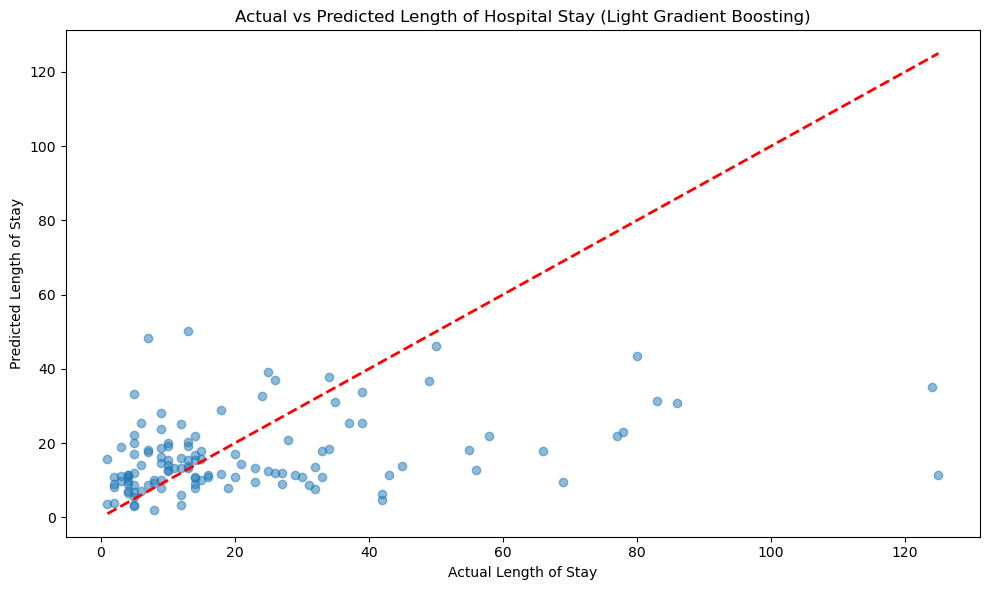

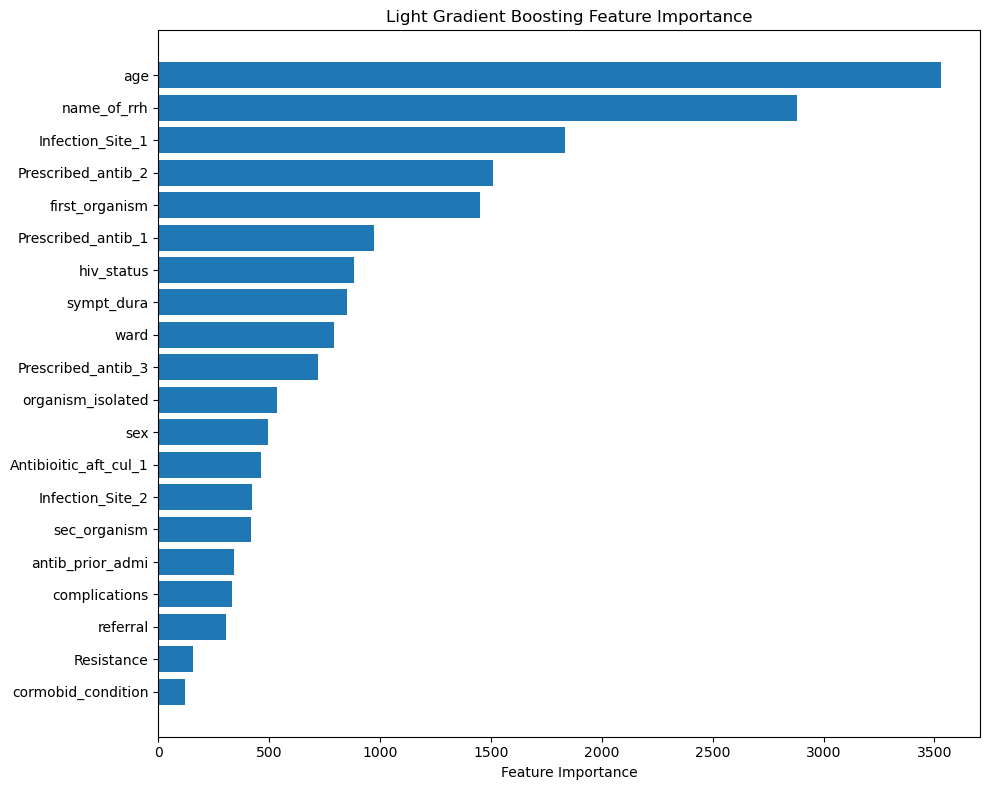

In [141]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Apply log transformation to the target variable
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters for Light Gradient Boosting
params = {
    'positive' : True,
    'random_state': 10,
    'max_iter': 1500,        
    'alpha': 0.006,   
    'fit_intercept': True,               
    'copy_X': True,
    'max_dept': 7,
    'subsample': 0.8,
    'n_estimators': 1000           
}

# Initialize and train the Light Gradient Boosting Regressor
xgb = XGBRegressor(**params)
xgb.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = lgbm.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(xgb, "LGBM_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Light Gradient Boosting)')
plt.tight_layout()
plt.show()

# Feature importance plot
feature_importance = lgbm.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Light Gradient Boosting Feature Importance')
plt.tight_layout()
plt.show()

In [142]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow XGB Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "XGB_regressor_model")

    # Infer the model signature
    signature = infer_signature(X_train, lgbm.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="XGB Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'XGB Regressor model' already exists. Creating a new version of this model...
2025/03/06 09:25:27 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model

🏃 View run powerful-shrike-768 at: http://127.0.0.1:8080/#/experiments/317490332836945887/runs/55d0000bcd434343a09c6be9756efb7c
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/317490332836945887


Created version '18' of model 'XGB Regressor model'.


# Lasso Elastic Regressor

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run capricious-bee-491 at: http://127.0.0.1:8080/#/experiments/317490332836945887/runs/527f8694541947a0b730eef8e9a104cc
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/317490332836945887
Mean Absolute Error: 14.49
Root Mean Squared Error: 24.20
R-squared Score: -0.0612


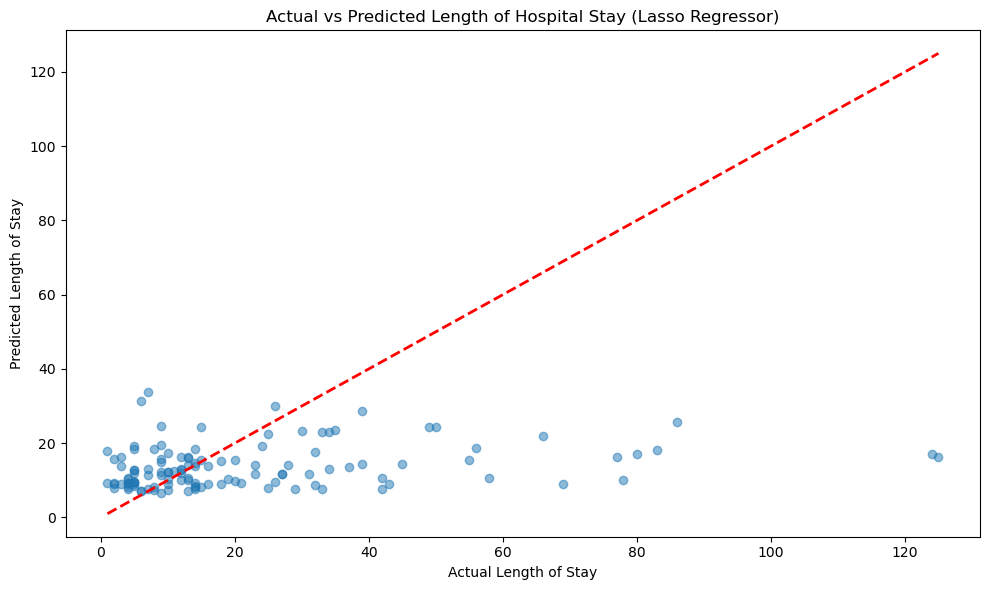

In [143]:
from sklearn.linear_model import Lasso

# Apply log transformation to the target variable
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters for Light Gradient Boosting
params = {
    'random_state':10,
    'alpha' : 00.006551,
    'fit_intercept' : True,
    'copy_X' : True,
    'max_iter' : 1500,
    'positive' : True
}


# Initialize and train the Light Gradient Boosting Regressor
lasso = Lasso(**params)
lasso.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = lasso.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(lasso, "Lasso_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Lasso Regressor)')
plt.tight_layout()
plt.show()

# # Feature importance plot
# feature_importance = lasso.feature_importances_
# sorted_idx = np.argsort(feature_importance)
# plt.figure(figsize=(10, 8))
# plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
# plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
# plt.xlabel('Feature Importance')
# plt.title('Lasso Regressor Feature Importance')
# plt.tight_layout()
# plt.show()

In [144]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow Lasso Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "Lasso_regressor_model")

    # Infer the model signature
    signature = infer_signature(X_train, lgbm.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="Lasso Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'Lasso Regressor model' already exists. Creating a new version of this model...
2025/03/06 09:25:33 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Mod

🏃 View run fortunate-chimp-682 at: http://127.0.0.1:8080/#/experiments/630657385198661799/runs/34c56a7b499f48a995178727b2e57254
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/630657385198661799


Created version '15' of model 'Lasso Regressor model'.


Best alpha from cross-validation: 0.006551
CV Mean Absolute Error: 0.7201 ± 0.1009
CV Root Mean Squared Error: 0.9210 ± 0.0977
CV R-squared Score: 0.0759 ± 0.1323


/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run sincere-dog-211 at: http://127.0.0.1:8080/#/experiments/630657385198661799/runs/a38cf7c5bcda4559be0316b416079164
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/630657385198661799
Test Mean Absolute Error: 14.49
Test Root Mean Squared Error: 24.20
Test R-squared Score: -0.0612


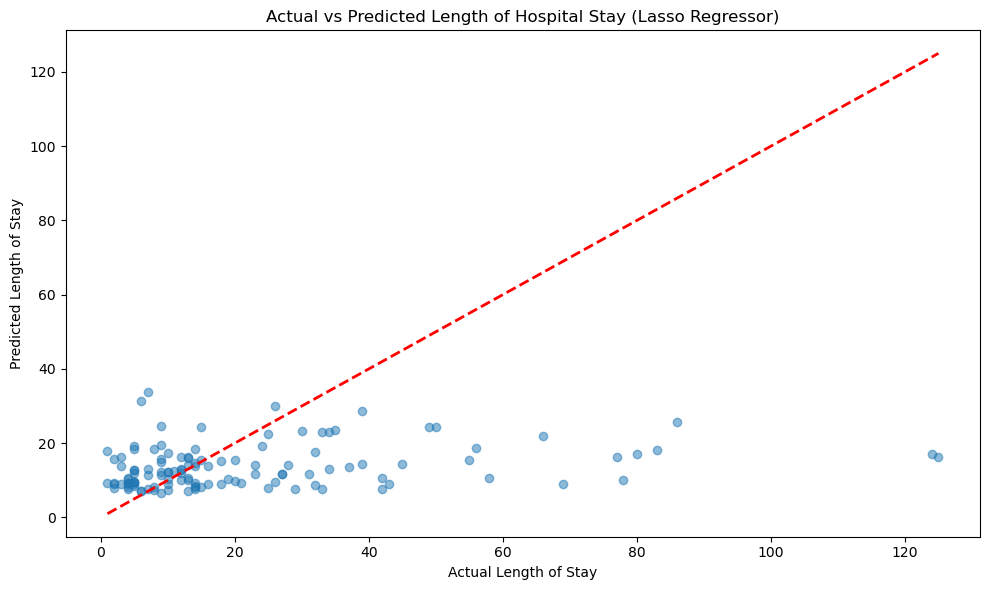

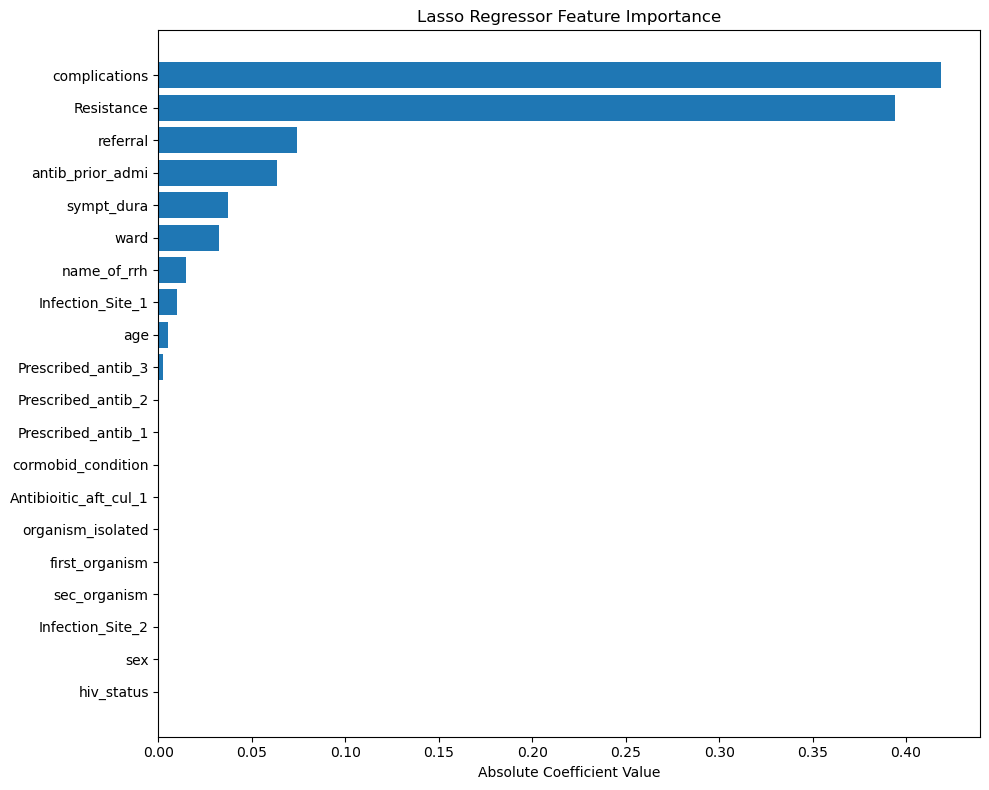

In [146]:
from sklearn.linear_model import Lasso, LassoCV
from sklearn.model_selection import train_test_split, KFold, cross_val_score

# Apply log transformation to the target variable
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 1. First approach: Cross-validation to find optimal alpha
alphas = np.logspace(-3, 1, 50)  # Range of alphas to test
lasso_cv = LassoCV(
    alphas=alphas,
    cv=25,
    random_state=10,
    max_iter=1500,
    positive=True,
    fit_intercept=True
)

# Fit the model
lasso_cv.fit(X_train, y_train)

# Get the best alpha
best_alpha = lasso_cv.alpha_
print(f"Best alpha from cross-validation: {best_alpha:.6f}")

# 2. Second approach: Cross-validation for model evaluation
params = {
    'random_state': 10,
    'alpha': best_alpha,  # Use the best alpha found
    'fit_intercept': True,
    'copy_X': True,
    'max_iter': 1500,
    'positive': True
}

# Initialize the model with the best parameters
lasso = Lasso(**params)

# Setup cross-validation
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Cross-validate and evaluate
cv_mae = -cross_val_score(lasso, X_train, y_train, cv=cv, 
                         scoring='neg_mean_absolute_error', n_jobs=-1)
cv_rmse = np.sqrt(-cross_val_score(lasso, X_train, y_train, cv=cv, 
                                 scoring='neg_mean_squared_error', n_jobs=-1))
cv_r2 = cross_val_score(lasso, X_train, y_train, cv=cv, 
                       scoring='r2', n_jobs=-1)

# Print cross-validation results
print(f"CV Mean Absolute Error: {cv_mae.mean():.4f} ± {cv_mae.std():.4f}")
print(f"CV Root Mean Squared Error: {cv_rmse.mean():.4f} ± {cv_rmse.std():.4f}")
print(f"CV R-squared Score: {cv_r2.mean():.4f} ± {cv_r2.std():.4f}")

# Train the final model with the best parameters on the full training set
final_lasso = Lasso(**params)
final_lasso.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = final_lasso.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("best_alpha", best_alpha)
    mlflow.log_metric("cv_mae_mean", cv_mae.mean())
    mlflow.log_metric("cv_rmse_mean", cv_rmse.mean())
    mlflow.log_metric("cv_r2_mean", cv_r2.mean())
    mlflow.log_metric("test_mae", mae)
    mlflow.log_metric("test_mse", mse)
    mlflow.log_metric("test_rmse", rmse)
    mlflow.log_metric("test_r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred_log)
    mlflow.sklearn.log_model(final_lasso, "Lasso_regressor_model", signature=signature)

# Print the test metrics
print(f"Test Mean Absolute Error: {mae:.2f}")
print(f"Test Root Mean Squared Error: {rmse:.2f}")
print(f"Test R-squared Score: {r2:.4f}")

# Scatter plot for predictions vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
         [y_test_original.min(), y_test_original.max()],
         'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Lasso Regressor)')
plt.tight_layout()
plt.show()

# Feature importance plot for Lasso using absolute coefficient values
feature_importance = np.abs(final_lasso.coef_)
feature_names = X.columns
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), feature_names[sorted_idx])
plt.xlabel('Absolute Coefficient Value')
plt.title('Lasso Regressor Feature Importance')
plt.tight_layout()
plt.show()

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run judicious-frog-47 at: http://127.0.0.1:8080/#/experiments/630657385198661799/runs/82f10795c4aa45d385edb492b19cbc11
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/630657385198661799
Mean Absolute Error: 14.51
Root Mean Squared Error: 24.26
R-squared Score: -0.0671


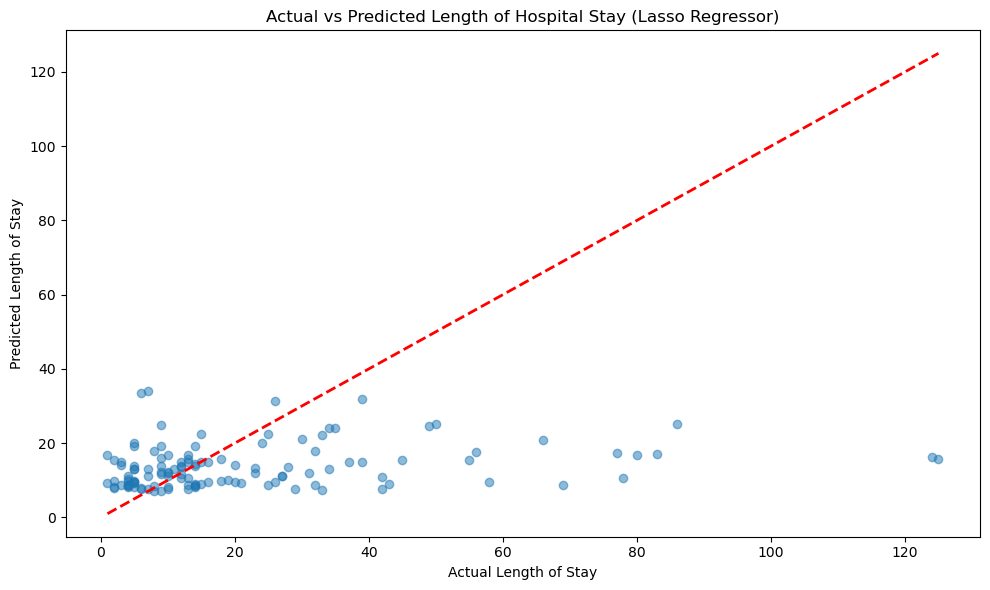

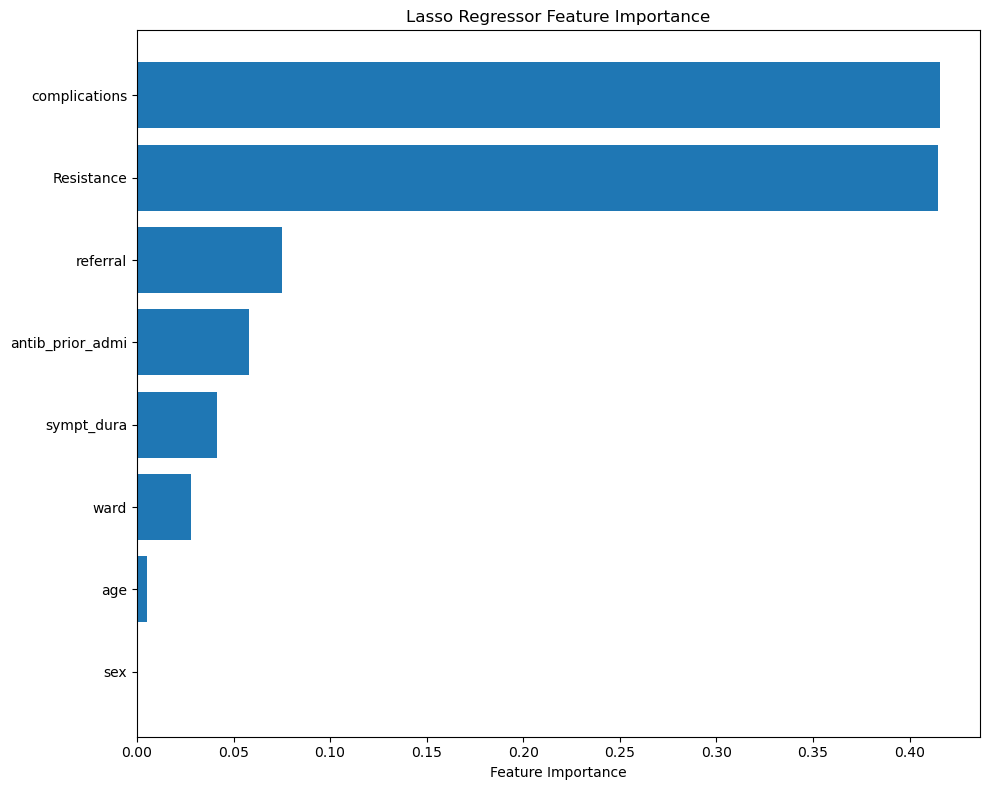

In [147]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import mlflow
from mlflow.models.signature import infer_signature

# Apply log transformation to the target variable
X = data[['complications', 'Resistance', 'referral', 'antib_prior_admi', 'sympt_dura', 'ward', 'age', 'sex']]
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define Lasso hyperparameters
params = {
    'random_state': 10,  # Not a parameter for Lasso
    'alpha': 0.006551,
    'fit_intercept': True,
    'max_iter': 1500,
    'positive': True
}

# Initialize and train the Lasso Regressor
lasso = Lasso(**params)
lasso.fit(X_train, y_train)

# Make predictions
y_pred_log = lasso.predict(X_test)
y_pred = np.expm1(y_pred_log)  
y_test_original = np.expm1(y_test)

# Calculate metrics
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(lasso, "Lasso_regressor_model", signature=signature)

# Print metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Lasso Regressor)')
plt.tight_layout()
plt.show()

# Feature Importance Plot for Lasso
feature_importance = np.abs(lasso.coef_)
sorted_idx = np.argsort(feature_importance)

plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Lasso Regressor Feature Importance')
plt.tight_layout()
plt.show()
